In [1]:
import torch
import math
from SC_IPFP.torch.utils import NN, log_kde_pdf_per_point, silvermans_rule
from SC_IPFP.torch.sde_solvers_time import solve_sde_RK


from tqdm.notebook import tqdm

from torch import nn

import itertools
from functools import partial
# np = jax.numpy
import matplotlib.pyplot as plt

In [2]:
def knn_log_prob(xTest, xTrain, k=36, w=0):
    """
    Can use this as an alternative to  log_kde_pdf_per_point, very noisy
    
    Approximate density p(x) ~ 1/kNN(x, {y_i})^d 
    the ln p(x) ~ - d * log kNN(x, {y_i})
    
    where kNN(x, {y_i}) is the distance of the kth nearest neighbour
    
    source: http://faculty.washington.edu/yenchic/18W_425/Lec7_knn_basis.pdf
    
    loss is very noisy, and goes down very slowly and un-monotnically
    
    Theres a lot of studies about these estimates for KL and entropy by Barnabas Poczos
    they might have refinements on the kNNN part. 
    
    w is a windowing parameter to take the mean of the kNN distance going backwards
    to the k-w nearest neighbours, to make things less noisy.    
    """
    k = int(k)
    w = int(min(w, k ))
    
    n, d = xTrain.shape
    
    sq_distances = -2 * torch.mm(xTrain, xTest.T) + torch.sum(xTest**2,axis=1) + torch.sum(xTrain**2,axis=1)[:, None]
    sq_distances = torch.clamp(sq_distances, 0, None)
    sq_distances, _ =  torch.sort(sq_distances,0) #distances sorted in axis 0
    sq_distance = torch.mean(sq_distances[ k,:])
#     print(sq_distance)
    return -(d * 0.5 * torch.log(sq_distance))

In [3]:
from torch import nn
class NN(nn.Module):

    def __init__(self, input_dim=1,  weight_dim_list=[20,20,20]):
        super(NN, self).__init__()

        self.weight_dim_list = [input_dim] + weight_dim_list
        self.layers = [None for i in weight_dim_list]

        for i in range(len(weight_dim_list)):
            setattr(
                self,
                "f" + str(i),
                nn.Linear(
                    self.weight_dim_list[i], self.weight_dim_list[i + 1],
                    bias=True
                )
            )
            self.layers[i]  = getattr(self, "f" + str(i))

            torch.nn.init.xavier_uniform(self.layers[i].weight)
    
    def get_var(self , other=None):
        return torch.tensor([[0]]).double()

    def forward(self, x, var=None):
        functerino = torch.relu
        x_ = x.clone()
        for i_, layer in enumerate(self.layers[:-1]):
            try:
                x = functerino(layer(x))
            except:
                print(x.shape, i_, x_.shape)
                import pdb; pdb.set_trace()
                raise
        try:
            return (self.layers[-1](x))
        except:
            import pdb; pdb.set_trace()
            raise


In [4]:
def solve_sde_RK(alfa=None, beta=None, X0=None, dt=1.0, N=100, t0=0.0,
                theta=None, noise=False, forwards=True):
    """
            Euler Mayurama method
    Syntax:
    ----------
    solve_sde(alfa=None, beta=None, X0=None, dt=None, N=100, t0=0, DW=None)
    Parameters:
    ----------
        alfa  : a  function with two arguments, the X state and the time
                defines the differential equation.
        beta  : a  function with two arguments, the X state and the time
                defines the stochastic part of the SDE.
        X0    : Initial conditions of the SDE. Mandatory for SDEs
                with variables > 1 (default: gaussian np.random)
        dt    : The timestep of the solution
                (default: 1)
        N     : The number of timesteps (defines the length of the timeseries)
                (default: 100)
        t0    : The initial time of the solution
                (default: 0)
    
    """
    
#     print(X0)
       
    if alfa is None or beta is None:
        raise ValueError("Error: SDE not defined.")

    n, d, *_ = X0.shape
    
    T = torch.tensor(dt * N).cuda()
    
    DWs  = torch.empty((n, N-1, d)).normal_(mean=0, std=1).cuda() * math.sqrt(dt)
    
    
    Y, ti = torch.zeros((n, N, d + 1)).double().cuda(), torch.arange(N).double().cuda()*dt + t0
    t0rep =  (
        t0 * torch.ones((X0.shape[0], 1)).double().cuda() if forwards
        else (T-t0) * torch.ones((X0.shape[0], 1)).double().cuda()
    )
#     Y[:, 0, :] =  torch.cat((X0, t0rep), axis=1 )
    Y = torch.cat((X0, t0rep), axis=1 )[:, None, :]

    N = int(N)
    
    T = dt * N
        
    for n in range(N-1):
        t = ti[n]
        a, DW_n = alfa(Y[:,n, :]),  DWs[:,n,:]
        newY = (  
            Y[:,n, :-1] + a * dt + beta * DW_n
        )
        
        trep = (
            t.repeat(newY.shape[0]).reshape(-1,1) if forwards
            else T - t.repeat(newY.shape[0]).reshape(-1,1)
        )
        
        tocat = torch.cat((newY, trep), dim=1)[:, None, :]
        Y = torch.cat((Y,tocat) , dim=1)
    if torch.isnan(Y).any() or torch.isinf(Y).any(): import pdb; pdb.set_trace()
#     import pdb; pdb.set_trace()
    return ti, Y

In [5]:
def divergence(outputs, inputs):
    grads_ = torch.autograd.grad(
            outputs, inputs, torch.ones_like(outputs),
            retain_graph=True, create_graph=True
     )[0]
    return grads_[:,:,:-1].sum(dim=2)

In [6]:
class cIPFP(object):
    
    def __init__(self, X_0, X_1, weights=[100], batch_size=None,  rng = None, rng_b = None, 
                nrng = None, number_time_steps=16, sde_solver=solve_sde_RK, sigma_sq=1, 
                step_size = 0.001, num_epochs = 10, weight_decay = 0.9, create_network=None,
                log_prob=log_kde_pdf_per_point, optimizer=torch.optim.SGD, lrs = None):
        
        self.sde_solver = sde_solver
        
        self.number_time_steps = number_time_steps
        self.dt = 1.0 / number_time_steps
        
        
        self.batch_size_f = X_0.shape[0] if batch_size is None else batch_size
        self.batch_size_b = X_1.shape[0] if batch_size is None else batch_size
        with torch.cuda.device(0):
        
            self.X_0 = X_0.requires_grad_()
            self.X_1 = X_1.requires_grad_()

            self.H_0 = silvermans_rule(X_0)
            self.H_1 = silvermans_rule(X_1)

            _, self.dim = self.X_0.shape

            weights = weights + [self.dim]


            self.b_forward = NN(self.dim + 1, weights).double().cuda()
            self.b_backward = NN(self.dim + 1, weights).double().cuda()

            self.theta_f = list(self.b_forward.parameters())
            self.theta_b = list(self.b_backward.parameters())

            self.sigma = sigma_sq

            self.optimizer_f = optimizer(
                self.theta_f, lr=step_size, weight_decay=weight_decay
            )

            self.optimizer_b = optimizer(
                self.theta_b, lr=step_size, weight_decay=weight_decay
            )
            
            m = 0.1
            lr_lambda = lambda epoch : 1.0 / (1.0 + lrs * epoch)


            self.lrs_f  = torch.optim.lr_scheduler.LambdaLR(self.optimizer_f, lr_lambda, last_epoch=-1)
            self.lrs_b  = torch.optim.lr_scheduler.LambdaLR(self.optimizer_b, lr_lambda, last_epoch=-1)

            num_complete_batches_f, leftover_f = divmod(self.X_0.shape[0], self.batch_size_f)
            self.num_batches_f = num_complete_batches_f + bool(leftover_f)

            num_complete_batches_b, leftover_b = divmod(self.X_1.shape[0], self.batch_size_b)
            self.num_batches_b = num_complete_batches_b + bool(leftover_b)

            self.first_iter_fac = 0.0

            self.log_prob = log_prob

            self.burn_in = False
    
    def data_stream(self, forward=True):
        X = self.X_0 if forward else self.X_1
        
        batch_size = self.batch_size_f if forward else self.batch_size_b
        num_batches = self.num_batches_f if forward else self.num_batches_b
        
        num_train = self.X_0.shape[0] if forward else self.X_1.shape[0]
        while True:
            perm = torch.randperm(X.size()[0])
            for i in range(num_batches):
                batch_idx = perm[i * batch_size:(i + 1) * batch_size]
                yield X[batch_idx] 
        
    def loss_for_trajectory(self, Xt, forwards):
        n_, *_ = Xt.shape
        
#         if not forwards :
#             Xt = Xt.flip(1)
        
        if forwards:
            b_minus  = self.b_backward.forward( Xt)
            b_plus = self.b_forward.forward(Xt)
            div = divergence(b_minus, Xt)
        else:
            b_minus  = self.b_backward.forward(Xt)
            b_plus = self.b_forward.forward(Xt) * self.first_iter_fac 
            div = -divergence(b_plus, Xt) * self.first_iter_fac 

            
        sign = 1.0 if forwards else -1.0
        
        time_integral = (sign *  (b_plus - b_minus))**2 * self.dt 
        out =  0.5 * time_integral.sum(dim=(1,2))  - (div.sum(dim=(1)) *  self.dt )
        
        return out


    def inner_loss_jit(self, batch,  
                       batch_terminal_empirical,
                       forwards):
        
        b = (
            self.b_forward.forward
            if forwards else (lambda X: -self.b_backward.forward(X))
        )
        
        t, Xt, *W = self.sde_solver(
            b, self.sigma, batch, self.dt, 
            self.number_time_steps, 0,
            None, False, forwards
        )
        Ht = silvermans_rule(Xt[:,-1,:-1])
        H = silvermans_rule(batch_terminal_empirical)
        
        main_term = self.loss_for_trajectory(Xt, forwards)

        if not self.burn_in:
#             xx = torch.linspace(-30, 30 , 1000).reshape(-1,1).double().cuda()
#             yy = self.log_prob( xx, batch_terminal_empirical, H)  
#             plt.plot(
#                 xx.detach().cpu().numpy(),
#                 np.exp(yy.detach().cpu().numpy())
#             )
#             plt.show()
            cross_entropy = -self.log_prob( Xt[:,-1,:-1], batch_terminal_empirical, H)             
        else:
            cross_entropy = -self.log_prob(batch_terminal_empirical, Xt[:,-1,:-1], Ht)

        J = torch.mean(main_term +  2.0 * cross_entropy )
        J = torch.squeeze(J)
        return J
    
    def inner_loss(self, batch, forwards=True):
        
        if self. burn_in:
            self.batch_terminal_empirical_burn = next(self.data_stream(forward=forwards))
            self.H_burn = self.H_0 if forwards else self.H_1
#         else:
        batch_terminal_empirical = next(self.data_stream(forward=not(forwards)))
        H = self.H_1 if forwards else self.H_0

        return self.inner_loss_jit(
            batch, batch_terminal_empirical,
            forwards
        )

    def closure(self, X, forwards=True):
        """
        Close method required for pytorches CG and LBFGS optimizers
        :params X[torch.tensor]: nxdim  torch tensor representing dataset
        """
        
        opt = self.optimizer_f if forwards else self.optimizer_b
        
        opt.zero_grad()
        loss = self.inner_loss(X, forwards)
        loss.backward()
        return loss
    
    
    def fit(self, IPFP_iterations=10, sub_iterations=10, plot=False, burn_iterations=7):     
        
        name = str(self.optimizer_f).lower()
        bfgs_cg_flag  = "bfgs" in name or "cg" in name
        close_f, close_b =  [], []

        
        
        if plot: self.plot_trajectories()
        
        self.first_iter_fac = 0.0
        if burn_iterations > 0 : self.burn_in = True
            
        
        batches_f = self.data_stream(forward=True)
        batches_b = self.data_stream(forward=False)
        
        loss_b, loss_f = [], []
        for i in tqdm(range(IPFP_iterations + burn_iterations)):
            
            if i == burn_iterations:
                self.burn_in = False
                self.first_iter_fac = 0.0
            
            
            for k in range(sub_iterations):
                for _ in range(self.num_batches_b):
                    batch_b =  next(batches_b)
                    
                    if bfgs_cg_flag:
                        close_b = [lambda : self.closure(batch_b, False)]
                    lossb = self.inner_loss(
                        batch_b, False
                    )
                    lossb.backward()
                    self.optimizer_b.step(*close_b)
                    self.lrs_b.step()
                print(f"loss b {lossb}")
            loss_b.append(lossb)

            self.first_iter_fac = 1.0
       
            for k in range(sub_iterations):
                for _ in range(self.num_batches_f):
                    batch_f =  next(batches_f)
                    if bfgs_cg_flag:
                        close_f = [lambda : self.closure(batch_f, True)]
                    lossf = self.inner_loss(
                        batch_f, True
                    )
                    
                    lossf.backward()
                    self.optimizer_f.step(*close_f)
                    self.lrs_f.step()
  
                print(f"loss f {lossf}")
            loss_f.append(lossf)


            self.loss_f = loss_f
            self.loss_b = loss_b
            if plot: self.plot_trajectories()

        
        plt.plot(range(IPFP_iterations), loss_f, "g")
        plt.show()
        plt.plot(range(IPFP_iterations), loss_b, "b")
        plt.show()
        
    def plot_trajectories(self):
        bb = lambda X: -self.b_backward(X)

        t, Xts = self.sde_solver(
            self.b_forward.forward, self.sigma,
            self.X_0, self.dt,  self.number_time_steps, 0.0,
            self.theta_f, False, True
        )
        t_, Xts_ = self.sde_solver(
            bb, self.sigma, 
            self.X_1, self.dt, self.number_time_steps, 0.0, 
            self.theta_b, False, False
        )
        
        fn = 14
        fig, axs = plt.subplots(2,1,  sharey=False, figsize=(15,10))
        axs[1].set_xlabel("$t$", fontsize=fn)
        axs[1].set_ylabel("$x(t)$", fontsize=fn)
        axs[0].set_ylabel("$x(t)$", fontsize=fn)

        tt = axs[1].get_xticks()
        axs[1].set_xticks(tt.flatten() )
        axs[1].set_xticklabels(list(map (lambda x: '{0:.2f}'.format((x)), tt))[::-1])

        for i in range(n):
            label = "$\mathbb{Q}$: Forward process" if i == 0 else None
            axs[0].plot(t.cpu().flatten(), Xts[i,:,:-1].detach().cpu().numpy().flatten(), 'b', alpha=0.03,  label=label)


        for i in range(n):
            label = "$\mathbb{P}$: Reverse process" if i == 0 else None
            axs[1].plot(t_.cpu().flatten(), Xts_[i,:, :-1].detach().cpu().numpy().flatten(), 'r', alpha=0.03, label=label)

        axs[1].legend(fontsize=fn)
        axs[0].legend(fontsize=fn)

        plt.show()    
    
    #     @partial(jit, static_argnums=(0,2))
    def transport_batch(self, batch_x, forwards):
        theta = self.theta_f if forwards else self.theta_b    
        b = self.b_forward if forwards else  lambda X, theta: -self.b_backward(X, theta)

        t, Xt = self.sde_solver(
            alfa=b, beta=self.sigma, dt=self.dt, 
            X0=batch_x.reshape(-1,self.dim), N=self.number_time_steps, theta=theta
        )

        return Xt[:,-1,:]
            

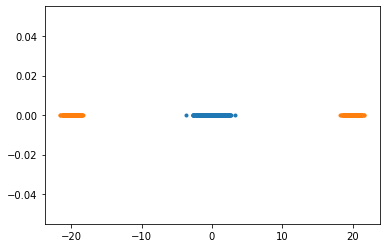

In [7]:
import numpy.random as npr
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

n = 900
n_2 = int(n * 1.0 / 3)
n_2 = int(n * 1.0 / 2.0)


X1 = npr.randn(n).reshape(-1,1) - 0
X21 = 0.6 * npr.randn(n_2).reshape(-1,1) + 20
X22 =  0.6 * npr.randn(n_2).reshape(-1,1) -20
# X23 =  0.6 * npr.randn(n_2).reshape(-1,1) + 20

X2 = np.concatenate((X21, X22), axis=0)
X1, X2 = X2, X1

plt.plot(X2.flatten(), [0] * n, '.')
plt.plot(X1.flatten(), [0] * n, '.')

with torch.cuda.device(0):

    X1 = torch.tensor(X1).cuda()
    X2 = torch.tensor(X2).cuda()

In [12]:


torch.cuda.manual_seed_all(10)
torch.manual_seed(10)

c = cIPFP(
    X1, X2,  number_time_steps=100, batch_size=900 ,
    step_size=1e-2, weights=[20, 20], rng = None,
    optimizer=torch.optim.Adam, lrs = 0.005, weight_decay=0, log_prob=knn_log_prob
)

/anaconda/envs/py37_default/lib/python3.7/site-packages/ipykernel_launcher.py:21: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.


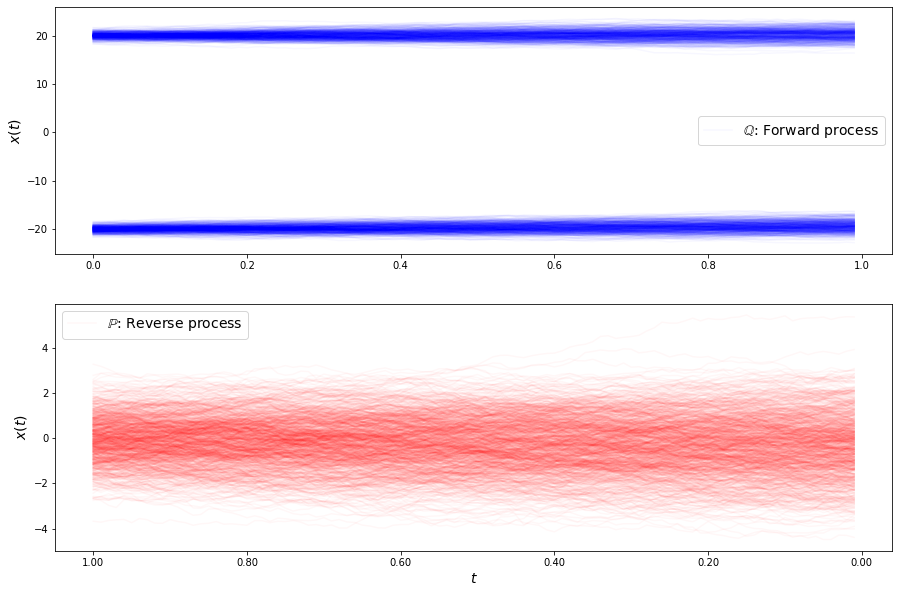

loss b 5.771365800469682
loss b 5.727341598881609
loss b 5.7538781073273215
loss b 5.815624023334114
loss b 5.818029217004615
loss b 5.773734641466323
loss b 5.741899416244297
loss b 5.72927321757134
loss b 5.727069202052369
loss b 5.751935094680106
loss b 5.783452585345066
loss b 5.8219188846301
loss b 5.860456545543615
loss b 5.88296669025095
loss b 5.890883670763622
loss b 5.884171061672611
loss b 5.866631531378655
loss b 5.847716217911226
loss b 5.8213321438905234
loss b 5.8021545289093925
loss b 5.776103904582357
loss b 5.76463471758568
loss b 5.747790595911496
loss b 5.740412130278692
loss b 5.732876481127208
loss b 5.734274739763644
loss b 5.728790947873061
loss b 5.732475200939913
loss b 5.723901155786479
loss b 5.7243481431072745
loss f 5.9759305040807105
loss f 7.149997991336664
loss f 5.95732976916855
loss f 7.3230080433709706
loss f 9.230314448826215
loss f 9.992540866001313
loss f 9.105699934354984
loss f 7.703306344834087
loss f 6.582033180966242
loss f 6.206677095835266


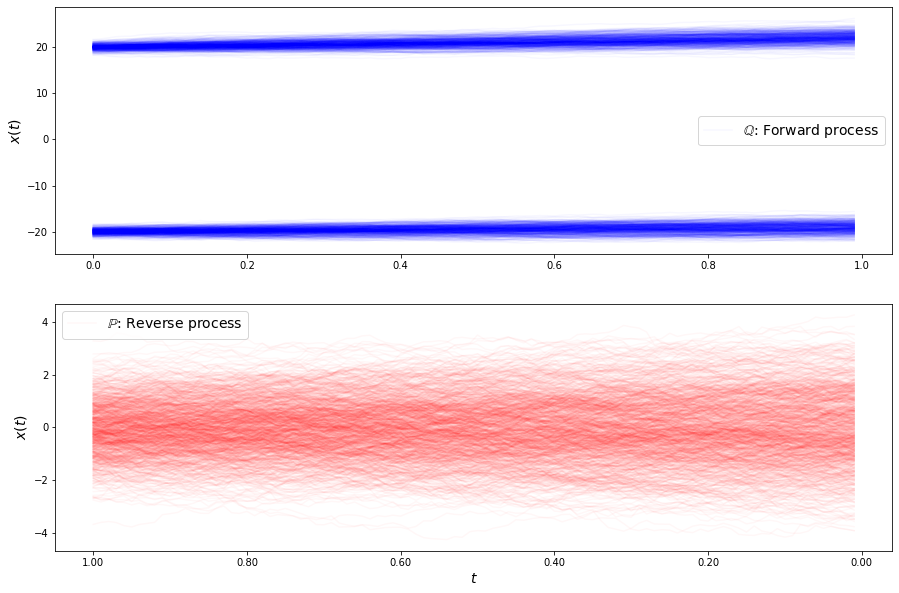

loss b 5.751824119680964
loss b 5.75568359449372
loss b 5.762085255269771
loss b 5.766482315428327
loss b 5.771490292344051
loss b 5.774214923921229
loss b 5.776997988900898
loss b 5.782342850567278
loss b 5.793894982875107
loss b 5.792852778649416
loss b 5.8005929586655585
loss b 5.806342699515862
loss b 5.819617338936174
loss b 5.816592783297571
loss b 5.829422410341664
loss b 5.839635190648404
loss b 5.848062062276682
loss b 5.858414357495489
loss b 5.868404881029114
loss b 5.8785199938708566
loss b 5.886343065946775
loss b 5.899408083434696
loss b 5.913180295704445
loss b 5.9222135036209504
loss b 5.92668648667358
loss b 5.936167661703354
loss b 5.931925120314206
loss b 5.938661624248565
loss b 5.92121629271145
loss b 5.915309384437334
loss f 22.14297083833984
loss f 23.264819648824712
loss f 23.844738908443205
loss f 23.937441254809944
loss f 23.039453936104948
loss f 21.797112970993314
loss f 20.09791840175614
loss f 18.34555593491741
loss f 16.449465023515167
loss f 14.635091402

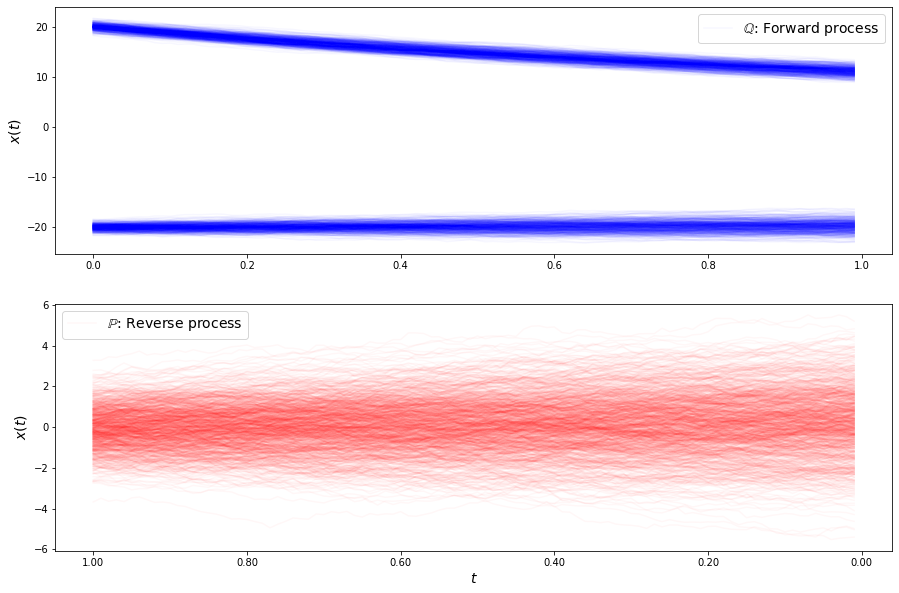

loss b 5.491218295155701
loss b 5.495863709097057
loss b 5.509939982874567
loss b 5.518289314151769
loss b 5.551146439384826
loss b 5.5768099174012455
loss b 5.6324231668974525
loss b 5.671251356735311
loss b 5.7213753870497275
loss b 5.788516914668699
loss b 5.8628400657390936
loss b 5.948963098675377
loss b 6.038549530972052
loss b 6.127707276198577
loss b 6.22979238215027
loss b 6.324606522803594
loss b 6.430844304138429
loss b 6.441732182973144
loss b 6.488496614454459
loss b 6.499626809934968
loss b 6.497043678897329
loss b 6.441737067634726
loss b 6.337255392306192
loss b 6.25721428761453
loss b 6.190447899506887
loss b 6.073744919674046
loss b 5.977795707894093
loss b 5.916356996494495
loss b 5.8399603951099595
loss b 5.746068382661577
loss f 96.01311210498261
loss f 95.85124467929369
loss f 94.12574940382656
loss f 91.13907805318783
loss f 88.2899593746007
loss f 84.52878864773939
loss f 80.07186124627408
loss f 74.7434261702501
loss f 69.6834714597488
loss f 64.09757028399605


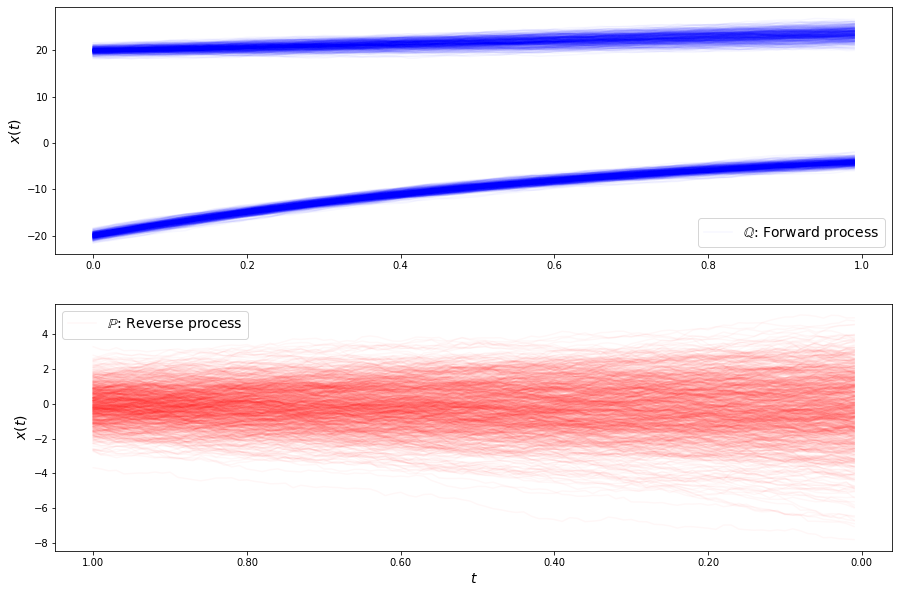

loss b 7.587337325479787
loss b 7.651671492447723
loss b 7.723033879204777
loss b 7.823520607277259
loss b 7.941950564784995
loss b 8.025802844931542
loss b 8.145217098471939
loss b 8.117937836714365
loss b 8.238065947565916
loss b 8.323151185134426
loss b 8.343758021736315
loss b 8.475382430373559
loss b 8.447121186051062
loss b 8.548589239929006
loss b 8.653783904264511
loss b 8.647177417579464
loss b 8.71761457479422
loss b 8.705502447177183
loss b 8.78552228736439
loss b 8.764029131118498
loss b 8.806679397578058
loss b 8.81143548815661
loss b 8.89719131174231
loss b 8.850253440953786
loss b 8.9125103594611
loss b 8.837567710558826
loss b 8.891482682325773
loss b 8.939436136983149
loss b 8.93269117858767
loss b 8.95159619689388
loss f 88.08028898550057
loss f 89.71445635528396
loss f 92.28536455980597
loss f 94.78651917836444
loss f 98.10879172004373
loss f 100.78856126100972
loss f 103.54871202558896
loss f 105.6468927245979
loss f 106.92214957082456
loss f 108.97842647837771
loss

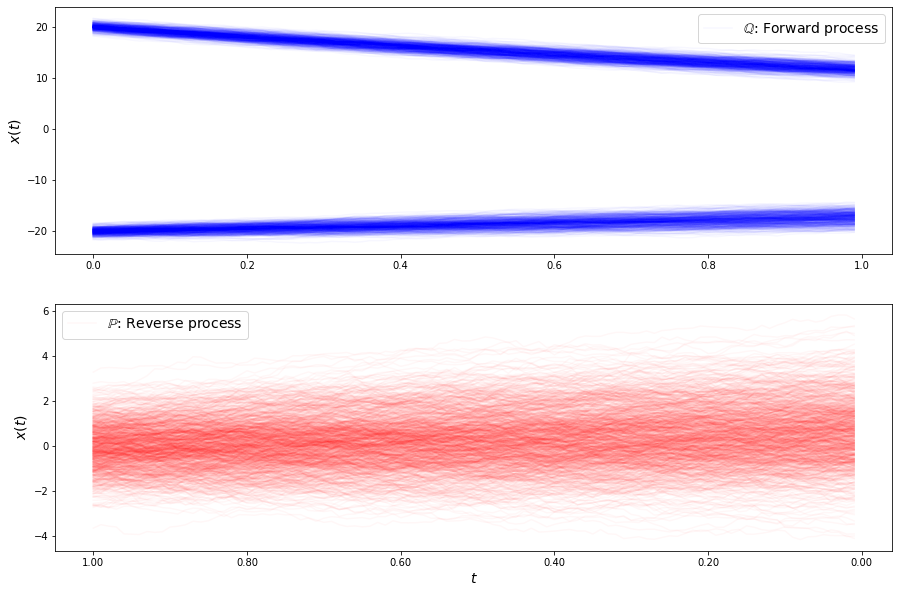

loss b 5.823877083765421
loss b 5.8524521448569145
loss b 5.83713571767659
loss b 5.845832703479342
loss b 5.858452928521665
loss b 5.842280443699389
loss b 5.842161153374409
loss b 5.856764090372451
loss b 5.8788435927077884
loss b 5.903703514700432
loss b 5.944319817583827
loss b 5.9757636616601655
loss b 6.0256112908970305
loss b 6.072405023278871
loss b 6.103398399045026
loss b 6.154949846026895
loss b 6.218673696081053
loss b 6.235378855737909
loss b 6.28912860414107
loss b 6.303638746764895
loss b 6.330688593689314
loss b 6.33831006282825
loss b 6.339822458187987
loss b 6.320236164938651
loss b 6.387563163750165
loss b 6.383703483687715
loss b 6.3328948035388315
loss b 6.396667105516807
loss b 6.378155051502275
loss b 6.368811721094996
loss f 30.093914165179395
loss f 30.17821925605423
loss f 30.99953904959446
loss f 32.9335023720174
loss f 35.73990612506474
loss f 39.28448335772749
loss f 43.1388028895479
loss f 47.41171482762139
loss f 51.038987783005105
loss f 54.1213963446509

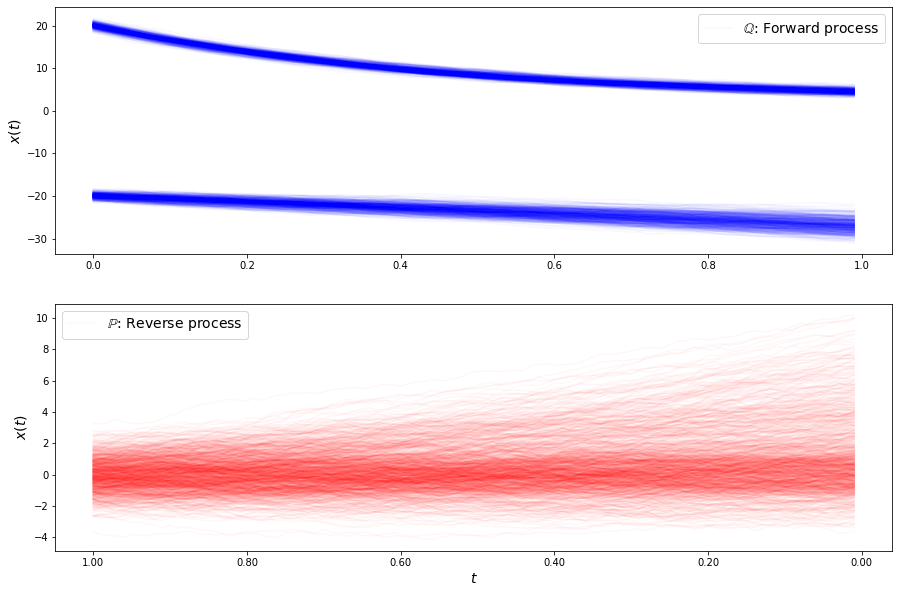

loss b 5.215663524495338
loss b 5.237301185282309
loss b 5.297838798169064
loss b 5.330381517071769
loss b 5.361066175457998
loss b 5.415202535335658
loss b 5.473486531084782
loss b 5.513559813984378
loss b 5.539880910412144
loss b 5.557779684640661
loss b 5.6376085572921815
loss b 5.6329553689715315
loss b 5.641562727864943
loss b 5.681799493198779
loss b 5.703157770556322
loss b 5.634943492610879
loss b 5.657884348519108
loss b 5.698493680572476
loss b 5.680918640453669
loss b 5.699357440143406
loss b 5.697007430284132
loss b 5.701234368100987
loss b 5.6937943789192325
loss b 5.6773232419508455
loss b 5.728456589380955
loss b 5.686874750788996
loss b 5.714044151936897
loss b 5.7400068158776065
loss b 5.732846333904483
loss b 5.7234543974740255
loss f 98.97663792135963
loss f 117.03001915950075
loss f 139.04515271999642
loss f 164.2702950477984
loss f 189.11346329504036
loss f 210.6114602799646
loss f 222.2206738045621
loss f 221.47515057325262
loss f 209.15614856694708
loss f 189.136

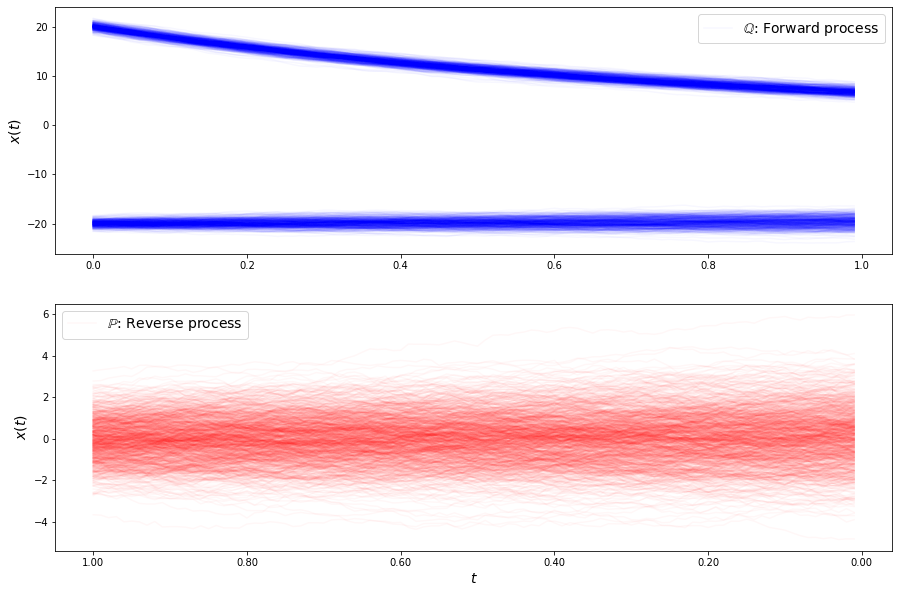

loss b 5.6124195380839055
loss b 5.599555154729162
loss b 5.594947715468599
loss b 5.592792303485956
loss b 5.583286162622133
loss b 5.598086341443183
loss b 5.620631317795964
loss b 5.574463885357821
loss b 5.581761541758464
loss b 5.595164686007254
loss b 5.582404005247997
loss b 5.590798717686531
loss b 5.564856598838003
loss b 5.581031813778193
loss b 5.603026230315579
loss b 5.594173994397797
loss b 5.5797177889444765
loss b 5.611829814392012
loss b 5.553653442683974
loss b 5.580098436518854
loss b 5.570451535573616
loss b 5.579641068948243
loss b 5.58067224819937
loss b 5.562301342870046
loss b 5.559633268721323
loss b 5.544784047316256
loss b 5.536007815322324
loss b 5.59812122465492
loss b 5.549740986792766
loss b 5.539756116692221
loss f 53.08687071402725
loss f 47.79660487290936
loss f 42.712471562268874
loss f 37.84066922614248
loss f 33.57783097246408
loss f 29.63846278185705
loss f 26.216625382165873
loss f 22.923446194176385
loss f 19.95623841054482
loss f 17.153757447253

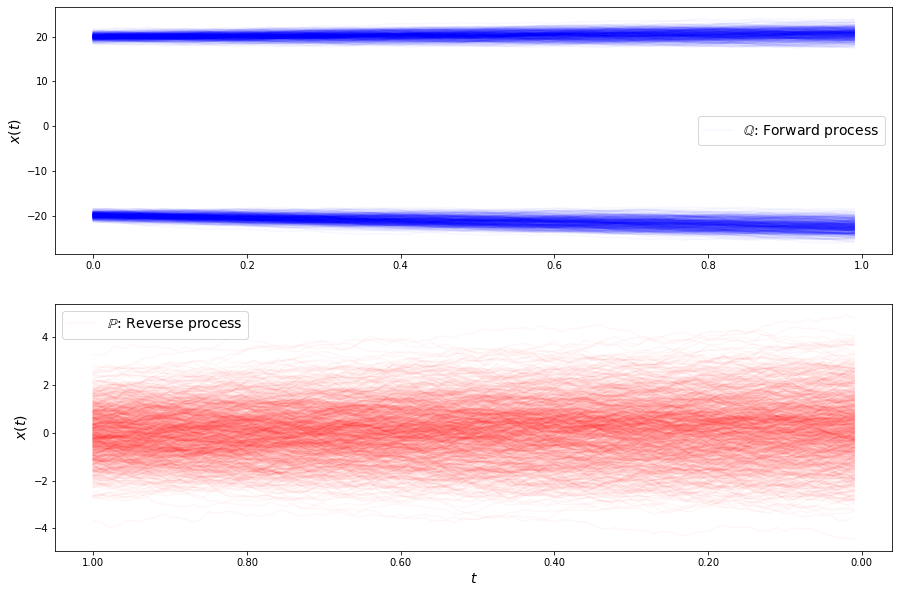

loss b 5.920356923694372
loss b 5.91427053911854
loss b 5.928619778926472
loss b 5.935477708310323
loss b 5.940883387879609
loss b 5.941109728124069
loss b 5.9505727779885405
loss b 5.96682286496546
loss b 5.968457312367953
loss b 5.9715972135072715
loss b 5.978954456464345
loss b 5.9921748287575705
loss b 5.99574234465322
loss b 5.999872247683161
loss b 6.002865933902873
loss b 6.011299537956294
loss b 6.025883859521658
loss b 6.025224438742882
loss b 6.036918939983509
loss b 6.037638888951365
loss b 6.053194667101964
loss b 6.053816047408929
loss b 6.059616159825409
loss b 6.072671006201134
loss b 6.078807331390947
loss b 6.08513869173739
loss b 6.091679848946553
loss b 6.096514617019027
loss b 6.107863015727294
loss b 6.1143266087015045
loss f 6.9624272410432
loss f 7.030300381269921
loss f 7.0547247830816175
loss f 7.041318950257711
loss f 7.026297387648211
loss f 6.926907526318722
loss f 6.839429301451154
loss f 6.692877888137228
loss f 6.558603190442781
loss f 6.407095251705911
l

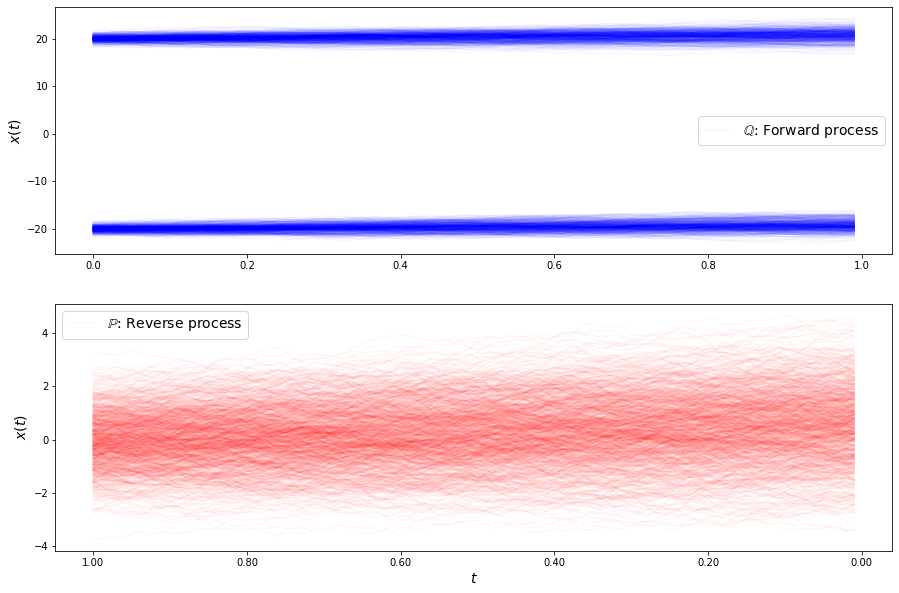

loss b 6.546472132066664
loss b 6.55782352468018
loss b 6.563777556196425
loss b 6.5688430745389175
loss b 6.5816432128835824
loss b 6.597015203279415
loss b 6.598756772568421
loss b 6.609493847036694
loss b 6.616097025168057
loss b 6.626614668045871
loss b 6.631901574312474
loss b 6.643296823422125
loss b 6.657448272127513
loss b 6.663793970770931
loss b 6.668171576112924
loss b 6.680487076801366
loss b 6.691492151300205
loss b 6.697607601318537
loss b 6.711598459782821
loss b 6.715538977783466
loss b 6.726860034993203
loss b 6.737814032811035
loss b 6.745533098803436
loss b 6.745986240287493
loss b 6.758756339488132
loss b 6.765272327019773
loss b 6.771511780355219
loss b 6.785948030971413
loss b 6.791493523159551
loss b 6.794100148566347
loss f 6.697637109768553
loss f 6.698330714074989
loss f 6.716194283933594
loss f 6.723512299115588
loss f 6.733399871099624
loss f 6.73840060096725
loss f 6.745493409919374
loss f 6.74857482900467
loss f 6.764011925537179
loss f 6.767906373342313
l

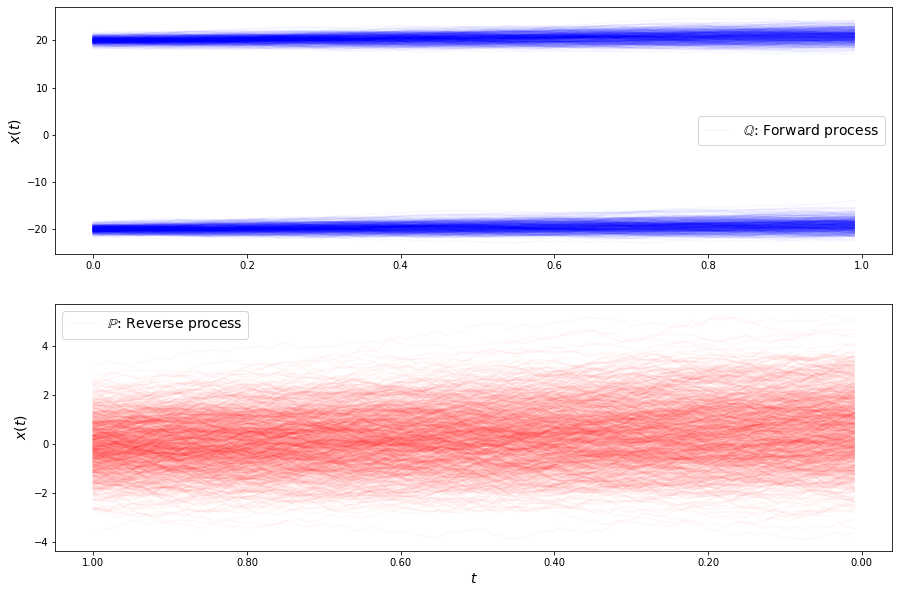

loss b 7.027717865602198
loss b 7.042481724709193
loss b 7.049793314769953
loss b 7.058840233207626
loss b 7.062737569496369
loss b 7.071254059984273
loss b 7.073333855005695
loss b 7.086378304769153
loss b 7.097572116279925
loss b 7.1026458248967295
loss b 7.1034750738784735
loss b 7.116792217524122
loss b 7.117163175301065
loss b 7.125796033916363
loss b 7.133279819413397
loss b 7.142654597707603
loss b 7.1462565648853715
loss b 7.15407130474388
loss b 7.159940308869197
loss b 7.166062555380589
loss b 7.165376404928489
loss b 7.175610770954281
loss b 7.179003257984901
loss b 7.185423075939979
loss b 7.18783705811458
loss b 7.190078943746612
loss b 7.19450814679062
loss b 7.204413823698764
loss b 7.208326180141955
loss b 7.213971466510823
loss f 7.12267183937681
loss f 7.1210481615938495
loss f 7.133350527821793
loss f 7.129722388786393
loss f 7.142544249260863
loss f 7.1445537927686695
loss f 7.147831086387195
loss f 7.1563749455001595
loss f 7.160107937900808
loss f 7.16578336358863

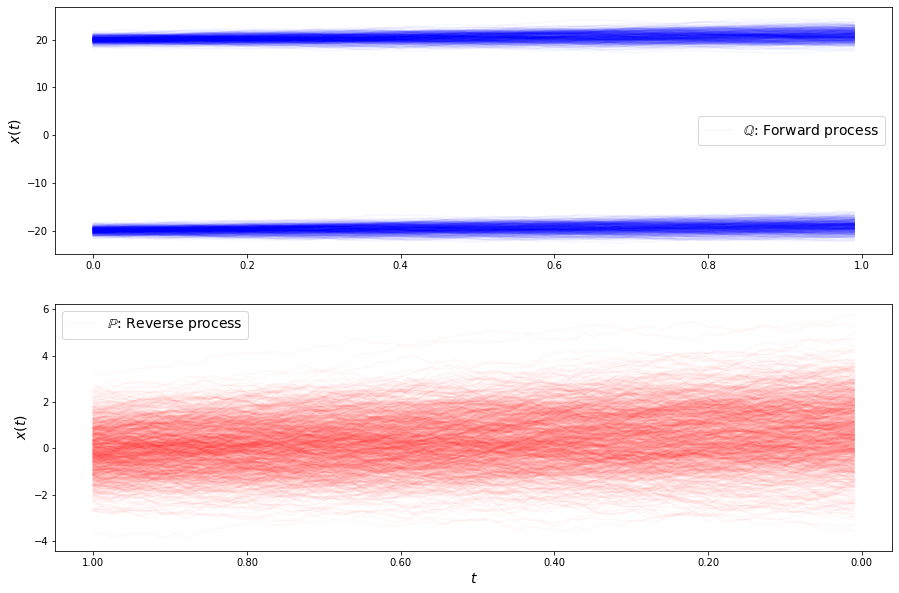

loss b 7.314309149223177
loss b 7.325174682215007
loss b 7.320867426834452
loss b 7.328320520546245
loss b 7.331034206022159
loss b 7.335775171398454
loss b 7.340150459747085
loss b 7.339686797608517
loss b 7.348766808437512
loss b 7.34768150445459
loss b 7.349797210315752
loss b 7.348609052006831
loss b 7.353071387455743
loss b 7.356761552505257
loss b 7.358750692097088
loss b 7.359203832543776
loss b 7.354433158246567
loss b 7.35936821000813
loss b 7.359642042590362
loss b 7.362070393051843
loss b 7.362206737479235
loss b 7.366740689116052
loss b 7.359848409416858
loss b 7.367539165153396
loss b 7.362263373975546
loss b 7.368589871736541
loss b 7.362748696456032
loss b 7.364909117291659
loss b 7.366348428946419
loss b 7.3656424368888125
loss f 7.2806214708463965
loss f 7.279079242373445
loss f 7.275722341666675
loss f 7.276028089073675
loss f 7.2807865729967896
loss f 7.282444739371335
loss f 7.281323603297864
loss f 7.268456323408425
loss f 7.277570207034824
loss f 7.27758420011952


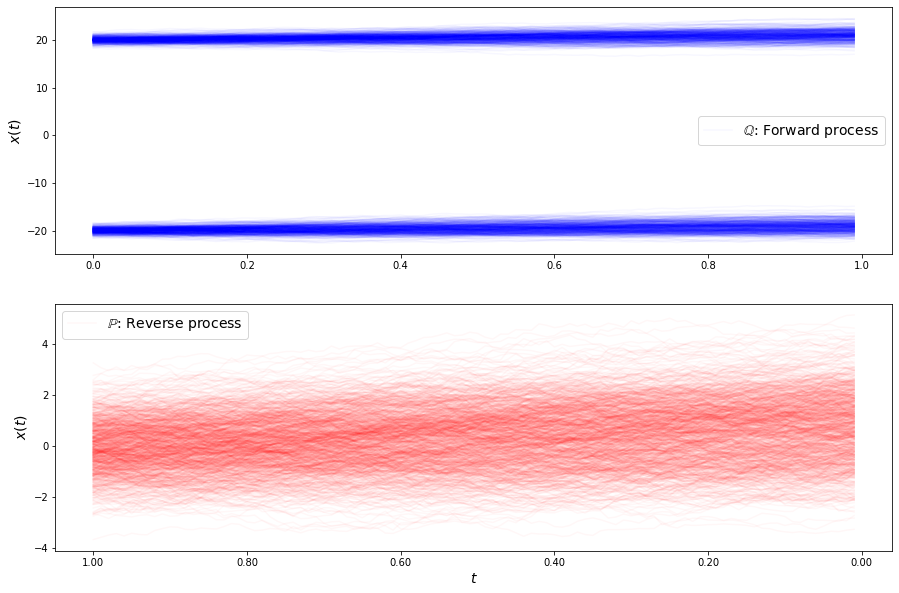

loss b 7.311399114050142
loss b 7.3087941591660615
loss b 7.3113630614532354
loss b 7.306432077695213
loss b 7.3020180233238845
loss b 7.303378310951334
loss b 7.300435702801488
loss b 7.299699090292422
loss b 7.29425071604492
loss b 7.289172171713198
loss b 7.291403702259781
loss b 7.287602871606617
loss b 7.280133969361557
loss b 7.2812449415449
loss b 7.273638418325966
loss b 7.278505249879271
loss b 7.267922524676584
loss b 7.2650004136377895
loss b 7.261843545275117
loss b 7.25481910001666
loss b 7.253155456904988
loss b 7.247153108953017
loss b 7.2402814711826275
loss b 7.229279538428166
loss b 7.227373831678887
loss b 7.216995392360662
loss b 7.211538737641203
loss b 7.201645079673561
loss b 7.192219172191761
loss b 7.181709461730521
loss f 7.109854434832988
loss f 7.10486211780777
loss f 7.104201208696332
loss f 7.09716926212686
loss f 7.08931845763737
loss f 7.088674003721542
loss f 7.085236214030974
loss f 7.073222674896622
loss f 7.071218224761063
loss f 7.070772722911549
lo

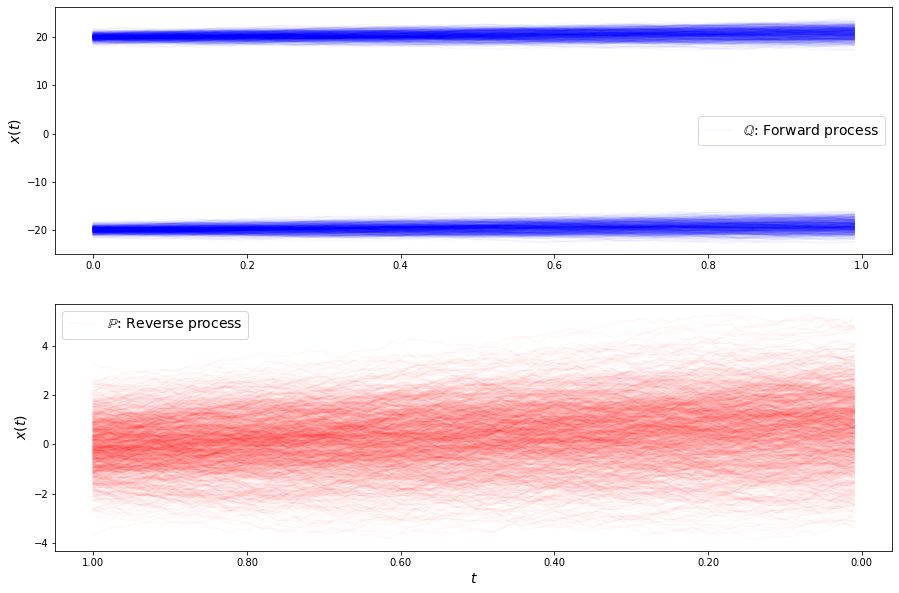

loss b 6.983802059545325
loss b 6.9691054863720225
loss b 6.94638978346162
loss b 6.942236255800377
loss b 6.9313319214019415
loss b 6.922392946014126
loss b 6.912032049549632
loss b 6.908088151344761
loss b 6.895971200957889
loss b 6.895264055207197
loss b 6.89169008371699
loss b 6.887525240773048
loss b 6.898867504659903
loss b 6.895781754305576
loss b 6.898230998578446
loss b 6.909091203853248
loss b 6.924513591689364
loss b 6.922138609671354
loss b 6.9428333339247414
loss b 6.967172063068179
loss b 6.956580849497282
loss b 6.97041351380812
loss b 6.964334247665863
loss b 6.967377951093708
loss b 6.95439582920816
loss b 6.928572471497927
loss b 6.91229867005909
loss b 6.88395704700133
loss b 6.859368209447867
loss b 6.854675164340089
loss f 6.713447488713342
loss f 6.707839541945005
loss f 6.700997171119062
loss f 6.6901003345950025
loss f 6.685366479419407
loss f 6.671786438023726
loss f 6.672406658098569
loss f 6.664164742700626
loss f 6.653040719280248
loss f 6.645967470837886
lo

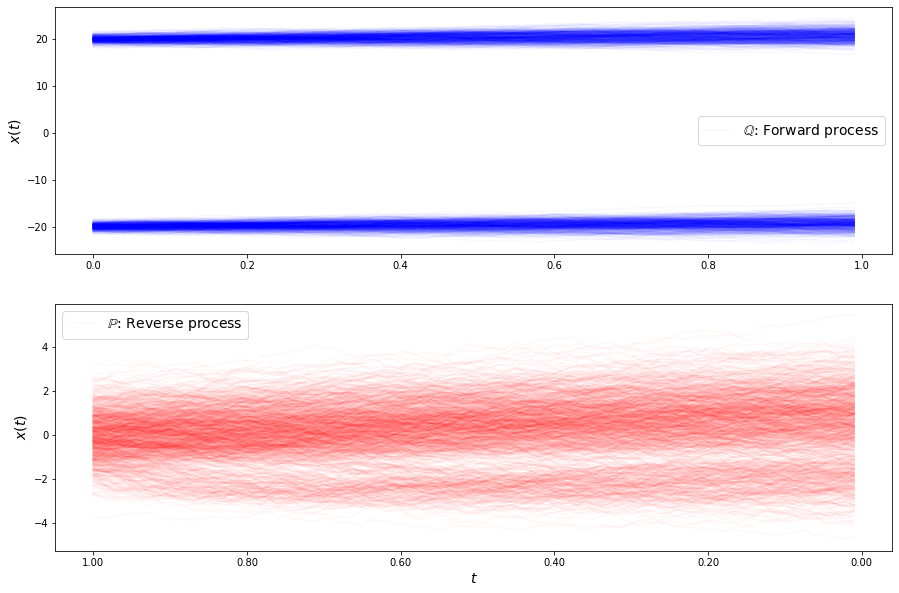

loss b 6.61593836845681
loss b 6.5881916850993365
loss b 6.565557637007027
loss b 6.543648270671301
loss b 6.5312710893765145
loss b 6.510747707781821
loss b 6.499581681234056
loss b 6.492126813441418
loss b 6.4769465316021355
loss b 6.475740148960948
loss b 6.4713223506804
loss b 6.464730238244197
loss b 6.467101446562527
loss b 6.463741124119954
loss b 6.464039274240426
loss b 6.456670029111154
loss b 6.457156018445787
loss b 6.454737140122197
loss b 6.448375043708948
loss b 6.43889542527779
loss b 6.437772495378604
loss b 6.432269626572725
loss b 6.422874895165469
loss b 6.417974552370513
loss b 6.41100349271448
loss b 6.407112931637274
loss b 6.394038181328437
loss b 6.393331094468197
loss b 6.380992651684453
loss b 6.375311015209887
loss f 6.267967118330166
loss f 6.257361839629138
loss f 6.256979583290763
loss f 6.249581645606336
loss f 6.23605948023896
loss f 6.2356486970892
loss f 6.224046269900593
loss f 6.2177257995848505
loss f 6.211936376006981
loss f 6.20103007025639
loss 

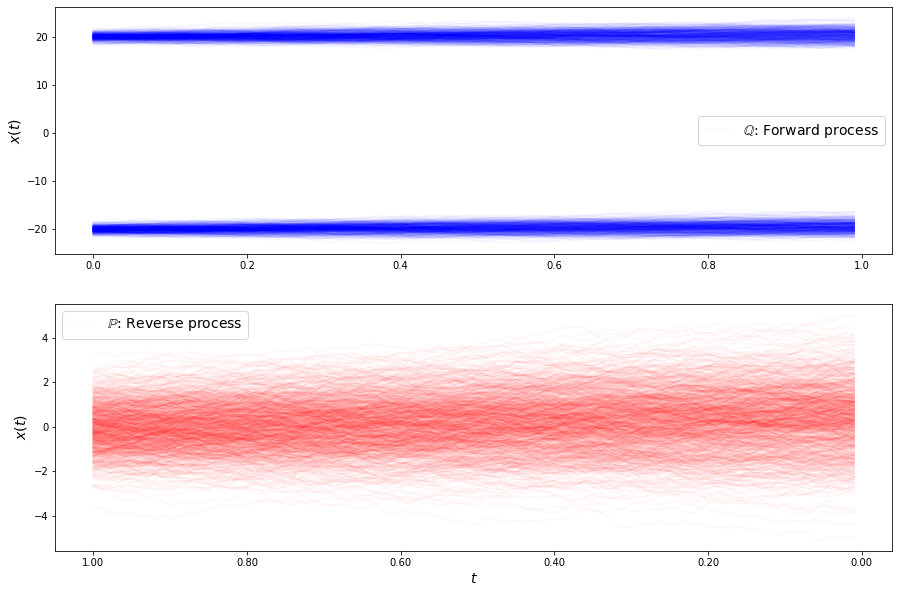

loss b 6.1772471392344785
loss b 6.17322671115617
loss b 6.162634924314699
loss b 6.153195834190605
loss b 6.154845971203421
loss b 6.146658991390523
loss b 6.144106998302333
loss b 6.139267251319315
loss b 6.1316821313950705
loss b 6.12801209413812
loss b 6.124497968807
loss b 6.113393185914296
loss b 6.106019538604647
loss b 6.103053276984981
loss b 6.095804037688191
loss b 6.087842248283557
loss b 6.089808237249371
loss b 6.082083839831051
loss b 6.08058957954677
loss b 6.073358646608092
loss b 6.066771492658364
loss b 6.065604066734964
loss b 6.061986666767421
loss b 6.05468372908127
loss b 6.051570373259343
loss b 6.049835775807633
loss b 6.039208521670328
loss b 6.035878884975307
loss b 6.028479854655694
loss b 6.025528649423498
loss f 5.918360591829185
loss f 5.90360750025837
loss f 5.9042223831439085
loss f 5.903140483626763
loss f 5.891614544632791
loss f 5.893817957031128
loss f 5.886139436763445
loss f 5.88255240846971
loss f 5.880232842803115
loss f 5.874807938518039
loss f

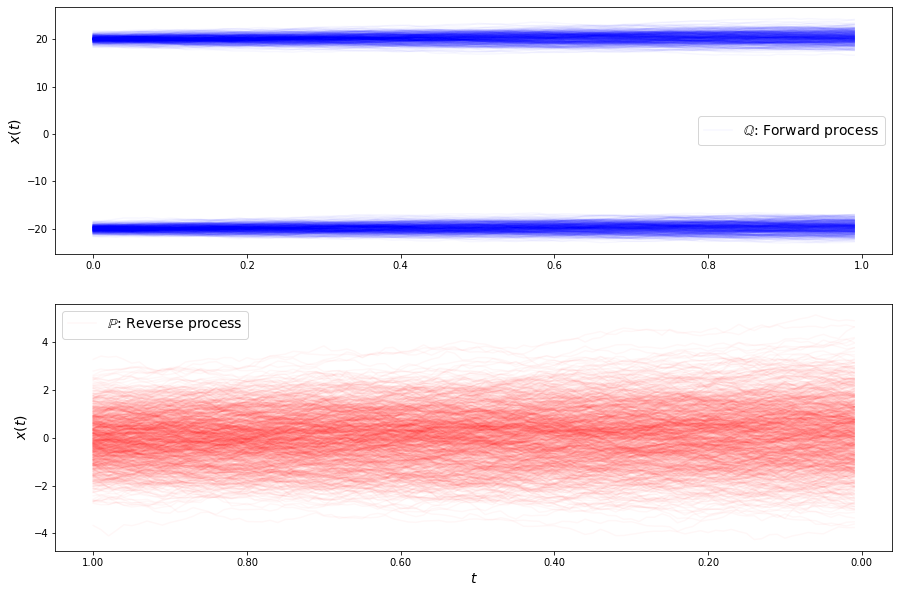

loss b 5.894669436176558
loss b 5.893975185075958
loss b 5.893339939709988
loss b 5.8907684650917185
loss b 5.884145680701805
loss b 5.876635637704821
loss b 5.877451813463647
loss b 5.87419764360612
loss b 5.872483574012287
loss b 5.8656161685852
loss b 5.859867115947111
loss b 5.858265743138867
loss b 5.857582379417487
loss b 5.8526681988792175
loss b 5.8512964154496
loss b 5.8519769317579255
loss b 5.845811577905379
loss b 5.843608380882303
loss b 5.835402684224482
loss b 5.835551023166942
loss b 5.834208093470878
loss b 5.829407659293464
loss b 5.825118031167841
loss b 5.828011283398171
loss b 5.825737830369965
loss b 5.823910709807413
loss b 5.819814622628623
loss b 5.816460062396374
loss b 5.817674959345371
loss b 5.816596445783355
loss f 5.697778171628551
loss f 5.692720977950313
loss f 5.698236207489414
loss f 5.694279151019378
loss f 5.691444912575002
loss f 5.688579370637085
loss f 5.687219236154032
loss f 5.687159195396805
loss f 5.683702448322401
loss f 5.679281277498985
lo

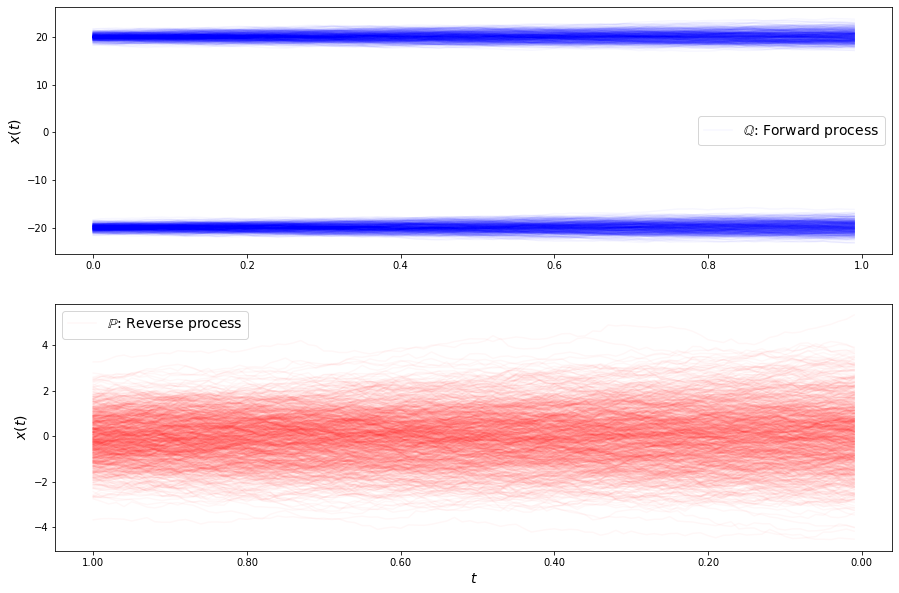

loss b 5.7565549282210755
loss b 5.7526058917018075
loss b 5.755395996543459
loss b 5.747407714990881
loss b 5.750642666457321
loss b 5.751991562252474
loss b 5.745265304543154
loss b 5.749565490594428
loss b 5.744873926681914
loss b 5.741703273359488
loss b 5.743708721581837
loss b 5.741780059794641
loss b 5.741350827089736
loss b 5.740300631905562
loss b 5.738802054813968
loss b 5.739135798325801
loss b 5.735740823719629
loss b 5.7321231494816685
loss b 5.7335452571584975
loss b 5.7301576551093945
loss b 5.7356382979553775
loss b 5.731661961120309
loss b 5.729795101431952
loss b 5.7340467209756225
loss b 5.72904345406686
loss b 5.735302943099583
loss b 5.730016637391602
loss b 5.726038871506888
loss b 5.736125046422157
loss b 5.728852022564399
loss f 5.620375219642683
loss f 5.6191086674746185
loss f 5.623764364319103
loss f 5.61855606791948
loss f 5.609721475102559
loss f 5.619053671551045
loss f 5.6148147255457985
loss f 5.616481996545952
loss f 5.617319239709494
loss f 5.623420778

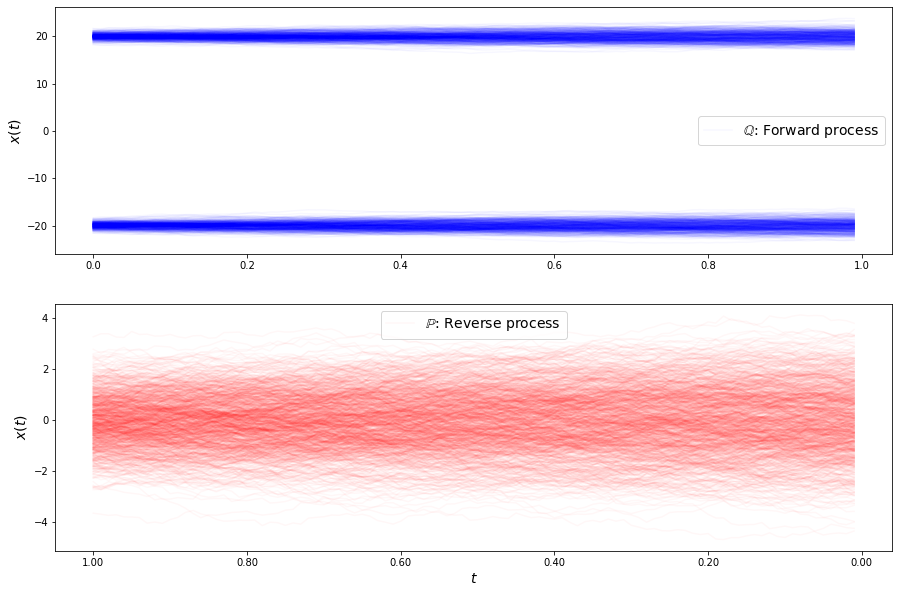

loss b 5.725168062260029
loss b 5.729730247471035
loss b 5.7282244584679685
loss b 5.731407888048979
loss b 5.729713427478765
loss b 5.730259818103407
loss b 5.729494841912591
loss b 5.733591446983483
loss b 5.7341374812842165
loss b 5.73368784542687
loss b 5.730507700360107
loss b 5.731830200003819
loss b 5.741198614856266
loss b 5.7414260384494185
loss b 5.74300725720273
loss b 5.734360485626885
loss b 5.7361506648108715
loss b 5.739524409109292
loss b 5.739766499012891
loss b 5.734457735142314
loss b 5.74159701577956
loss b 5.740093059357917
loss b 5.745953351129638
loss b 5.745713998882942
loss b 5.748475188366527
loss b 5.74457944894431
loss b 5.7434272597271185
loss b 5.748280346912535
loss b 5.751065755045602
loss b 5.749343804583653
loss f 5.635196362972621
loss f 5.6421135107193265
loss f 5.640113375968044
loss f 5.6408292690892905
loss f 5.645451214470756
loss f 5.639223977482679
loss f 5.645256761273214
loss f 5.645958811963029
loss f 5.644704245359452
loss f 5.6492424229247

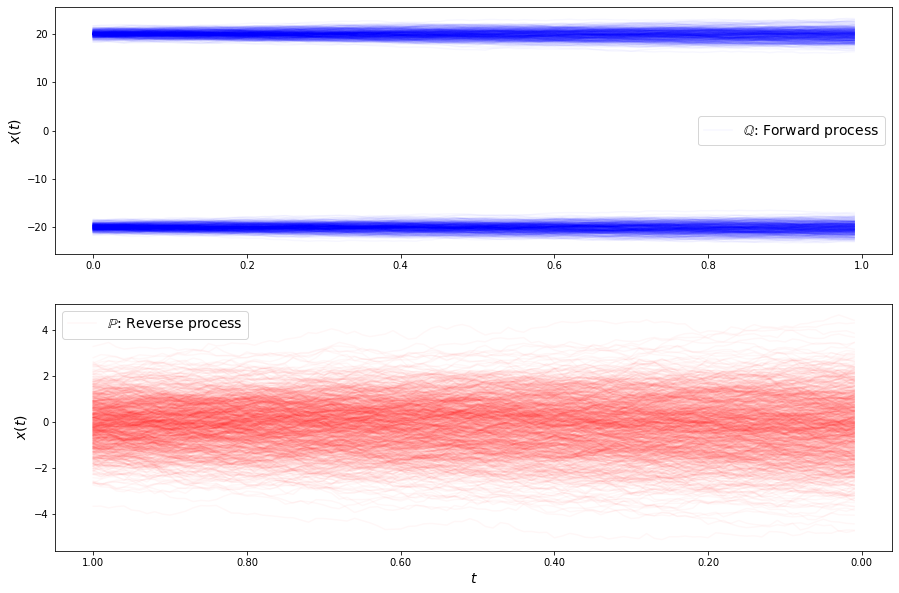

loss b 5.785770244931525
loss b 5.787745949789363
loss b 5.792199500318956
loss b 5.790832274344218
loss b 5.794662698126036
loss b 5.798848358054751
loss b 5.799933425340994
loss b 5.797060383169397
loss b 5.7973690902779
loss b 5.79862603716278
loss b 5.804274007890101
loss b 5.802004042860601
loss b 5.811122759286397
loss b 5.806173093946312
loss b 5.811374154811912
loss b 5.812248378838581
loss b 5.818269482382906
loss b 5.816185757287849
loss b 5.814863781579831
loss b 5.814591223552209
loss b 5.8201372584735624
loss b 5.821048599880563
loss b 5.8270482547545805
loss b 5.826950007829362
loss b 5.825325241789171
loss b 5.83330502418174
loss b 5.82724168063182
loss b 5.832820261140998
loss b 5.83341238377311
loss b 5.8371253224038275
loss f 5.733568684788186
loss f 5.7337907810692945
loss f 5.734713808106827
loss f 5.734769737835382
loss f 5.734837795065824
loss f 5.737268290701198
loss f 5.732413849997618
loss f 5.743307983071891
loss f 5.745662286018373
loss f 5.747163471351132
lo

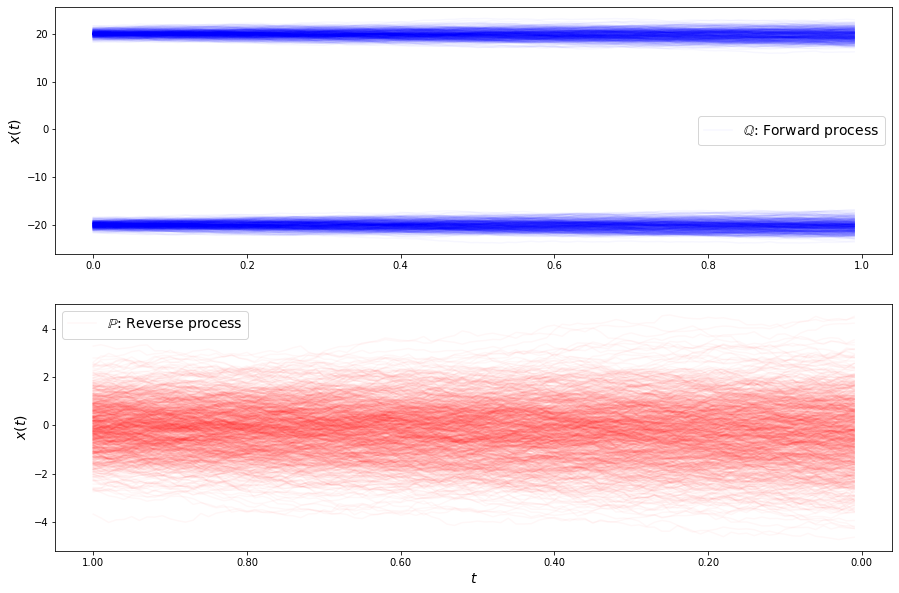

loss b 5.903238720079979
loss b 5.905468410950293
loss b 5.909947059135005
loss b 5.9068264407378255
loss b 5.910250448188063
loss b 5.920564775205194
loss b 5.916888852517477
loss b 5.919939230407391
loss b 5.923252612603665
loss b 5.921758902806016
loss b 5.921728364230645
loss b 5.9295750150103625
loss b 5.929911923825447
loss b 5.927611735435222
loss b 5.933291929517757
loss b 5.936007012857634
loss b 5.937547140023571
loss b 5.941958465163828
loss b 5.944510611302837
loss b 5.938289846631257
loss b 5.946000352220971
loss b 5.955670325289286
loss b 5.952219418943662
loss b 5.950209814568187
loss b 5.955592955475029
loss b 5.959118724342102
loss b 5.964338915173044
loss b 5.958153352338456
loss b 5.96214610455507
loss b 5.967156337399586
loss f 5.861820144671549
loss f 5.8648839015867695
loss f 5.866391644539099
loss f 5.874000102497216
loss f 5.869969086396096
loss f 5.8831098662472545
loss f 5.876128778064196
loss f 5.87739362777569
loss f 5.886929338812884
loss f 5.88498031306601

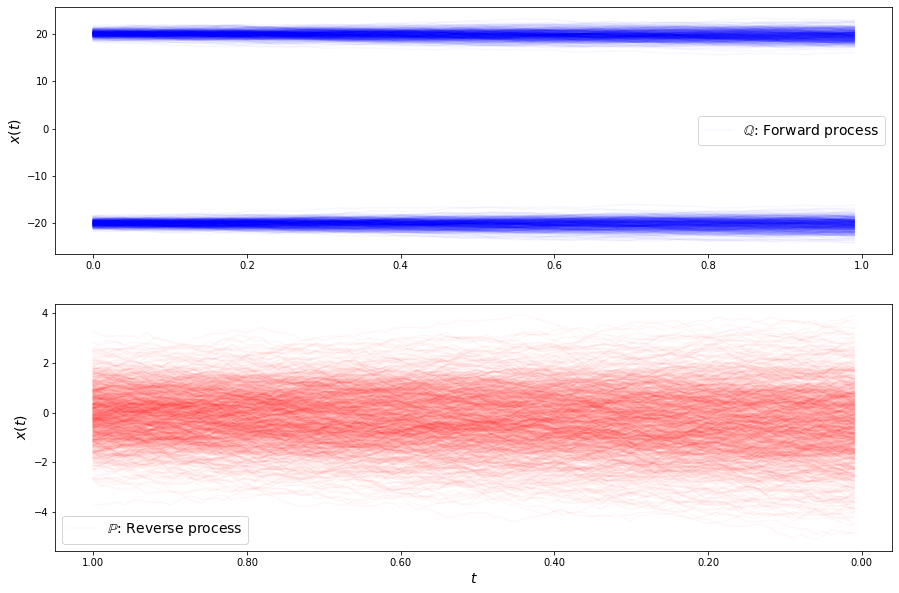

loss b 6.041211186108039
loss b 6.049027372079481
loss b 6.049317077781094
loss b 6.05434407849044
loss b 6.057546502299593
loss b 6.051841355498764
loss b 6.061949081014216
loss b 6.062540164666859
loss b 6.066706827748655
loss b 6.069040613508722
loss b 6.068498300508977
loss b 6.074952143615683
loss b 6.079844638028652
loss b 6.073765657394807
loss b 6.079215533616602
loss b 6.087268907299328
loss b 6.086520532587451
loss b 6.089729769008706
loss b 6.093512692689874
loss b 6.09511234957098
loss b 6.099153974299496
loss b 6.099774307522314
loss b 6.101462662819488
loss b 6.105299498191348
loss b 6.107904136074459
loss b 6.110992010510036
loss b 6.113716044846399
loss b 6.115571554769153
loss b 6.118993025837539
loss b 6.109904086321033
loss f 6.015885994264673
loss f 6.021248975426757
loss f 6.027525176508867
loss f 6.0201563274623355
loss f 6.023539642965974
loss f 6.028506615902059
loss f 6.039495206289833
loss f 6.035521940198805
loss f 6.042553809432085
loss f 6.041942067286956
l

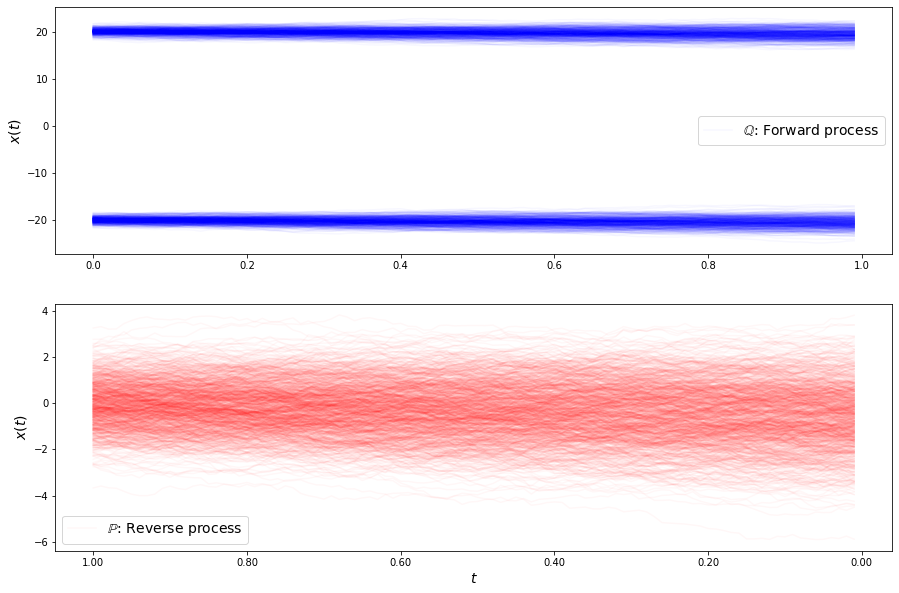

loss b 6.199296328780105
loss b 6.1924207694492015
loss b 6.206283695744369
loss b 6.209849884861867
loss b 6.2107309181307935
loss b 6.213854033341938
loss b 6.209697691564766
loss b 6.212082981190033
loss b 6.218016988375787
loss b 6.222484287499561
loss b 6.223042988755559
loss b 6.224929424136049
loss b 6.228444059261475
loss b 6.229961440272551
loss b 6.240328474514054
loss b 6.234715089251666
loss b 6.241448985615361
loss b 6.242480618230086
loss b 6.246572893999919
loss b 6.240746277940561
loss b 6.249475993816207
loss b 6.250502332825022
loss b 6.253796642996385
loss b 6.2574713062691165
loss b 6.258304587181902
loss b 6.260912248419248
loss b 6.267103625327387
loss b 6.2684181685224365
loss b 6.267271933383027
loss b 6.268393877209972
loss f 6.171832166295355
loss f 6.17672308168736
loss f 6.172813486414649
loss f 6.178003930551385
loss f 6.182462491009981
loss f 6.178628917537978
loss f 6.18757978467822
loss f 6.187855226865924
loss f 6.19560515155582
loss f 6.198514587190254

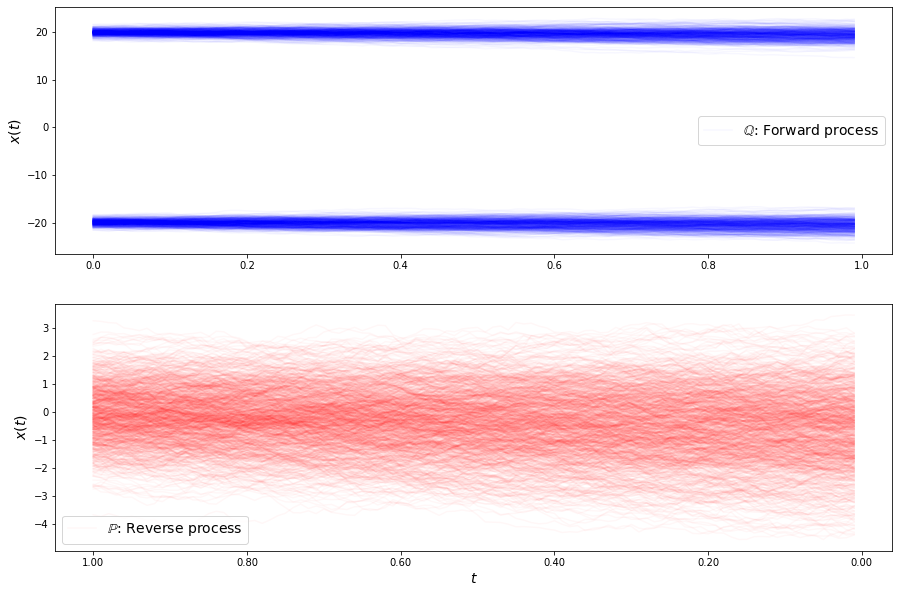

loss b 6.344056710224934
loss b 6.34808588677945
loss b 6.345758242976271
loss b 6.352463446715082
loss b 6.355735788956324
loss b 6.353492305361594
loss b 6.360079295150314
loss b 6.359997563856186
loss b 6.3593817621109014
loss b 6.366973053159092
loss b 6.364222015465918
loss b 6.369652020677762
loss b 6.369752339374466
loss b 6.367160718882615
loss b 6.370657953850049
loss b 6.3721646173492426
loss b 6.3763505407788275
loss b 6.378507718521289
loss b 6.378249532005348
loss b 6.385766838168073
loss b 6.383832058324824
loss b 6.3852975012221265
loss b 6.383584361931692
loss b 6.3875473792897335
loss b 6.392432582988991
loss b 6.394369309874416
loss b 6.3976415885358495
loss b 6.4041993338341845
loss b 6.398684450329632
loss b 6.406141807235357
loss f 6.303295531048585
loss f 6.302833250502501
loss f 6.307869412510115
loss f 6.30464196451301
loss f 6.315227688497448
loss f 6.30903775215222
loss f 6.321937326724006
loss f 6.319682301035233
loss f 6.321048919768273
loss f 6.322697194849

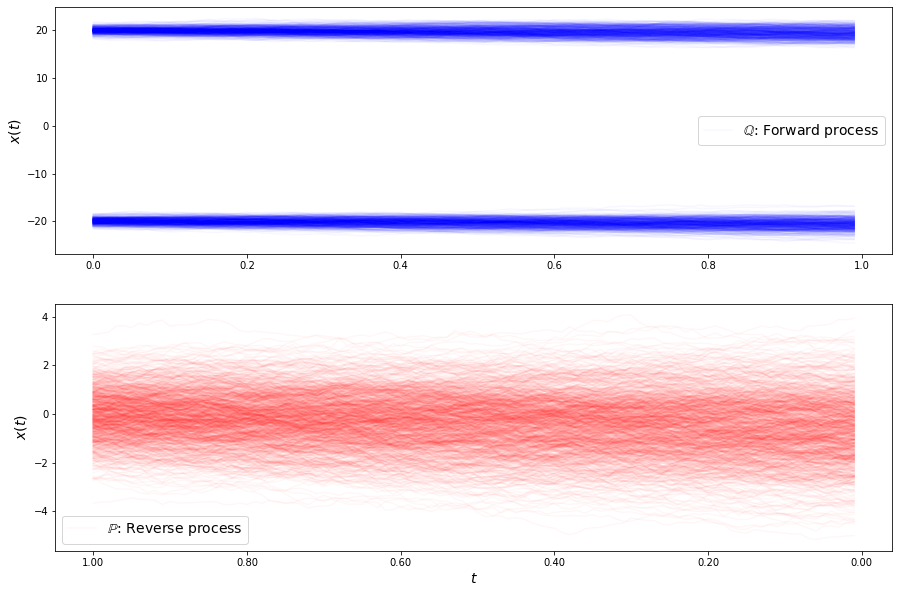

loss b 6.463007078249563
loss b 6.462934159188292
loss b 6.463029212127071
loss b 6.4704332407674325
loss b 6.464841572964538
loss b 6.464910132710175
loss b 6.473690406151714
loss b 6.473787580750839
loss b 6.476832462755783
loss b 6.4752389439370965
loss b 6.478260823673361
loss b 6.477828198935339
loss b 6.47933747577787
loss b 6.485134479276106
loss b 6.4821643075390645
loss b 6.48653329735961
loss b 6.492317613236868
loss b 6.492835057366033
loss b 6.485832738490978
loss b 6.492605814306612
loss b 6.488340116668809
loss b 6.493940504618408
loss b 6.495259998698611
loss b 6.502247144680524
loss b 6.500457231554415
loss b 6.501990948305348
loss b 6.494066845837638
loss b 6.498806698307454
loss b 6.504595726704679
loss b 6.500999646586508
loss f 6.409760242241683
loss f 6.40497981640331
loss f 6.407881064640447
loss f 6.4067675183114
loss f 6.417337544310923
loss f 6.414896224393372
loss f 6.420939160730512
loss f 6.416908023371621
loss f 6.415227466512176
loss f 6.4267696702875305
l

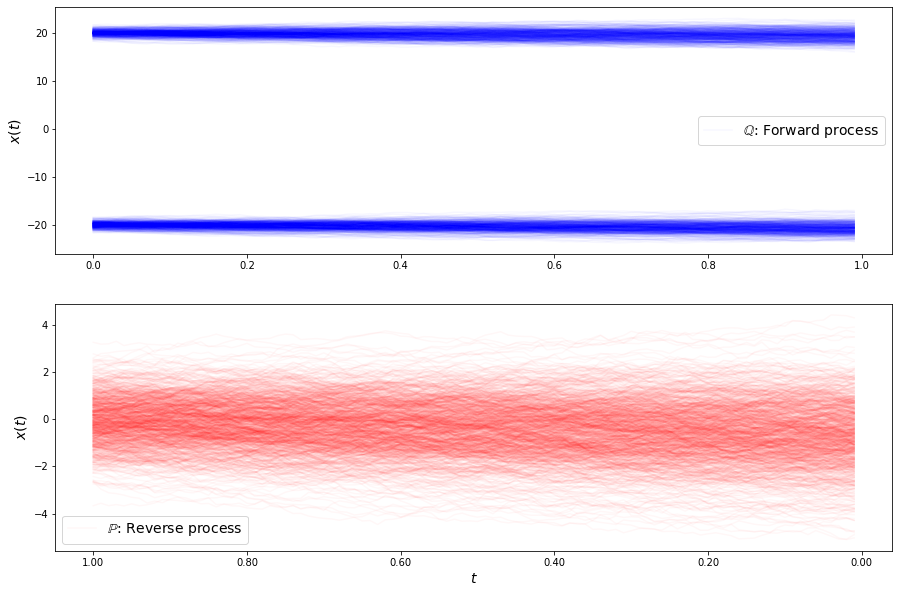

loss b 6.538784400657638
loss b 6.542599413474495
loss b 6.546112678785864
loss b 6.548284796781806
loss b 6.547791825110203
loss b 6.550895008412922
loss b 6.5508815742040065
loss b 6.548542594177384
loss b 6.549879322032626
loss b 6.546824298052654
loss b 6.5508783573043115
loss b 6.552204712948615
loss b 6.557217026864683
loss b 6.555649683120965
loss b 6.549774366851991
loss b 6.559044714689575
loss b 6.555934699216283
loss b 6.560223554565889
loss b 6.560298318568293
loss b 6.558477143445742
loss b 6.564162966308973
loss b 6.55765473311693
loss b 6.563287766628674
loss b 6.563280971956414
loss b 6.56314436723116
loss b 6.565060961763319
loss b 6.561086313343749
loss b 6.56485413908038
loss b 6.563559970180624
loss b 6.5634911187526255
loss f 6.47111546921884
loss f 6.4686295059515855
loss f 6.468182138230521
loss f 6.473172845962437
loss f 6.470817931236051
loss f 6.473741554829418
loss f 6.477822844108178
loss f 6.4726883661929495
loss f 6.467927177098147
loss f 6.469242102022502

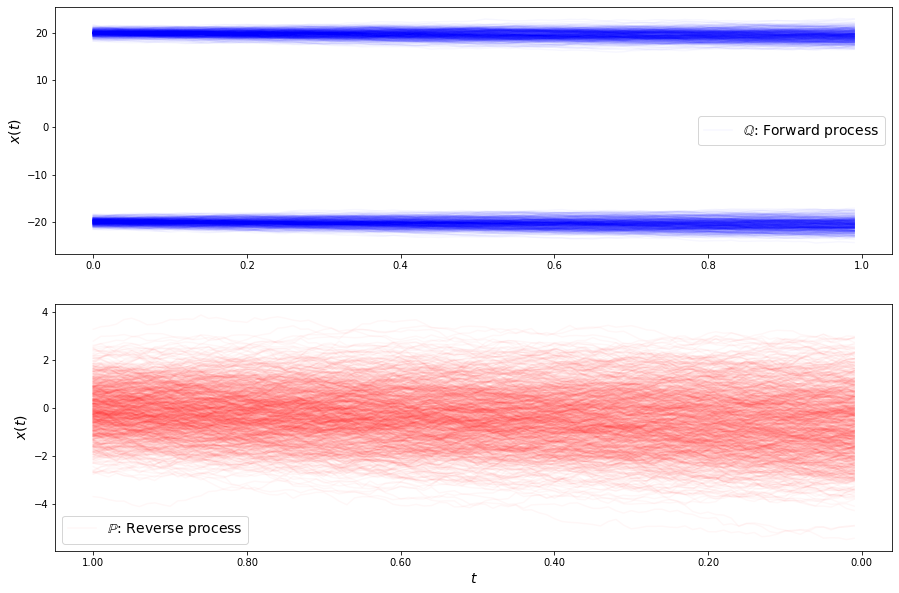

loss b 6.578478866838034
loss b 6.576529339374782
loss b 6.581296936968953
loss b 6.584078552994176
loss b 6.576131689475518
loss b 6.585426802399229
loss b 6.574140942823438
loss b 6.579847392327576
loss b 6.575778326584302
loss b 6.579883374408974
loss b 6.574854462699031
loss b 6.579628377574603
loss b 6.574039349646545
loss b 6.5774472752825766
loss b 6.580956014593614
loss b 6.577428875351923
loss b 6.577446962105921
loss b 6.577340330534931
loss b 6.574977655324889
loss b 6.5813206246764695
loss b 6.57619316499053
loss b 6.571946641766988
loss b 6.575927148754742
loss b 6.568004788326337
loss b 6.579255143866906
loss b 6.57427432643842
loss b 6.578557482622668
loss b 6.572156547117411
loss b 6.574037250450643
loss b 6.575237969729664
loss f 6.470503362318099
loss f 6.478497646508953
loss f 6.473897396495504
loss f 6.476154286592067
loss f 6.472639819146084
loss f 6.474016404964621
loss f 6.476638222288449
loss f 6.472992977044497
loss f 6.476022397146437
loss f 6.479821889492971


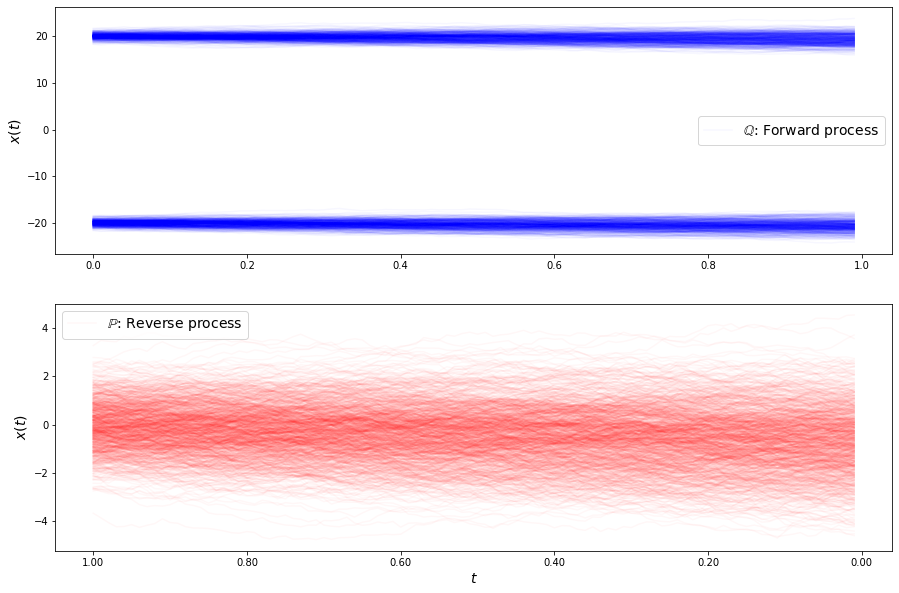

loss b 6.562556105096192
loss b 6.554043827375928
loss b 6.561804508004301
loss b 6.556570760444293
loss b 6.560546957886544
loss b 6.563446103792629
loss b 6.555903941965125
loss b 6.556095352098176
loss b 6.557853612406979
loss b 6.55038939676498
loss b 6.553471147661254
loss b 6.551102845064725
loss b 6.552755688959604
loss b 6.5501475204619855
loss b 6.5575700960017045
loss b 6.553027031849428
loss b 6.550162446737592
loss b 6.5484093094408555
loss b 6.550711492821999
loss b 6.543362066977928
loss b 6.544983181076303
loss b 6.537907128524146
loss b 6.54259378277866
loss b 6.537592452608052
loss b 6.541937172337055
loss b 6.5346504849430405
loss b 6.537196846110922
loss b 6.541814401141467
loss b 6.543236075487596
loss b 6.540225340337411
loss f 6.4377944684702
loss f 6.439564538439938
loss f 6.4369651421084715
loss f 6.426833118662773
loss f 6.435213114659935
loss f 6.429400642765845
loss f 6.433200927748666
loss f 6.4299990369526405
loss f 6.4254600535090365
loss f 6.4297309570902

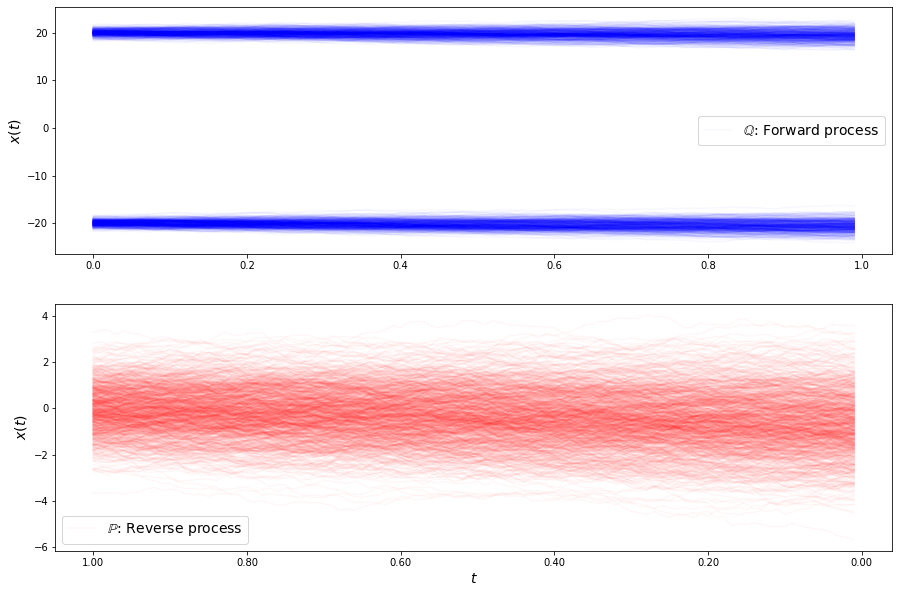

loss b 6.497418054949582
loss b 6.4996717815939835
loss b 6.497468153583212
loss b 6.4897083269483655
loss b 6.490308472327574
loss b 6.495783952602949
loss b 6.495504652286798
loss b 6.4909311203129265
loss b 6.48546705753003
loss b 6.483707140576437
loss b 6.487425889206884
loss b 6.477851185616384
loss b 6.480912184170732
loss b 6.481044401293851
loss b 6.475292113089245
loss b 6.46988400164144
loss b 6.471489239899812
loss b 6.479399141895851
loss b 6.470270315655001
loss b 6.468830722094801
loss b 6.463879189372369
loss b 6.467483464740247
loss b 6.464040053644642
loss b 6.463065768257313
loss b 6.456797108427406
loss b 6.453959771783127
loss b 6.457075744802195
loss b 6.454982541064586
loss b 6.453375922028229
loss b 6.456075164885
loss f 6.353150251061919
loss f 6.349339183287331
loss f 6.347950651809229
loss f 6.348482338872879
loss f 6.3434177203562205
loss f 6.339311814607104
loss f 6.337762130022812
loss f 6.3383084149324
loss f 6.335733816539558
loss f 6.328245513558121
los

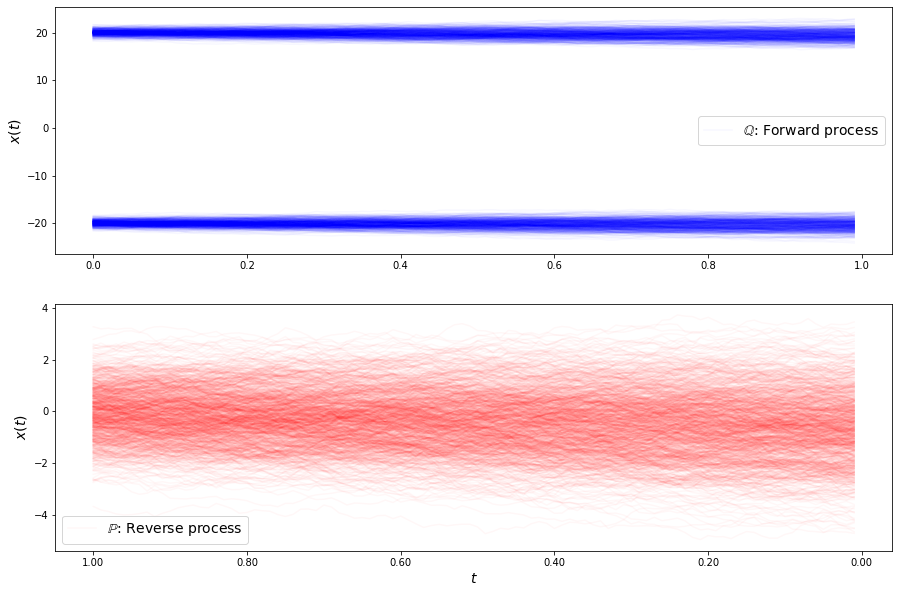

loss b 6.389378802129118
loss b 6.393008415601623
loss b 6.392615359949406
loss b 6.389271448297833
loss b 6.3910511271022195
loss b 6.379281967602249
loss b 6.378536422100103
loss b 6.376184613616422
loss b 6.376852892403323
loss b 6.377141610515111
loss b 6.37846305313268
loss b 6.379282846927017
loss b 6.366671558371349
loss b 6.377033504192225
loss b 6.3604854040970595
loss b 6.3650996198488725
loss b 6.36121945941482
loss b 6.3642612529347335
loss b 6.358334767690428
loss b 6.358604532559077
loss b 6.353288469639949
loss b 6.350494607477962
loss b 6.346284626005178
loss b 6.349202239377911
loss b 6.3455419542205895
loss b 6.343052229958637
loss b 6.342133956751155
loss b 6.339018874028331
loss b 6.343684723547143
loss b 6.335747862245054
loss f 6.2283268998202725
loss f 6.227341459730857
loss f 6.226160022842402
loss f 6.22301733523055
loss f 6.2155789520771565
loss f 6.2162177315874425
loss f 6.215276489827599
loss f 6.223290869531602
loss f 6.219875397532043
loss f 6.20384861436

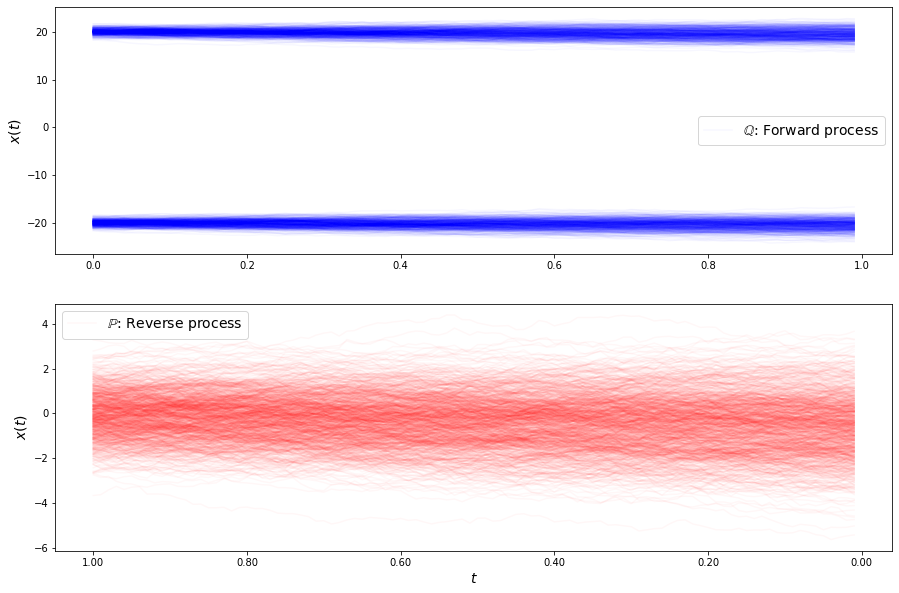

loss b 6.257750604089139
loss b 6.261653894687993
loss b 6.265997256379247
loss b 6.258844111897146
loss b 6.257485418062975
loss b 6.252882624587134
loss b 6.2502944261779385
loss b 6.251416867156516
loss b 6.248227683812797
loss b 6.246188000306563
loss b 6.242759820209532
loss b 6.2403760500296155
loss b 6.242248720907692
loss b 6.2344448650926365
loss b 6.233988015552213
loss b 6.229920499522637
loss b 6.228326297430582
loss b 6.227790979442823
loss b 6.225395384652795
loss b 6.223552238027223
loss b 6.219998008395797
loss b 6.2155659772822
loss b 6.218768406070652
loss b 6.215625693266841
loss b 6.2095475963709
loss b 6.212361574559785
loss b 6.206461021770473
loss b 6.20654756220053
loss b 6.202740424504362
loss b 6.196796698986077
loss f 6.099736197577817
loss f 6.097074892155985
loss f 6.090321928794636
loss f 6.084661918839634
loss f 6.08266883363155
loss f 6.085312164854976
loss f 6.084207857901424
loss f 6.075926769485429
loss f 6.075510052208271
loss f 6.067365591755745
los

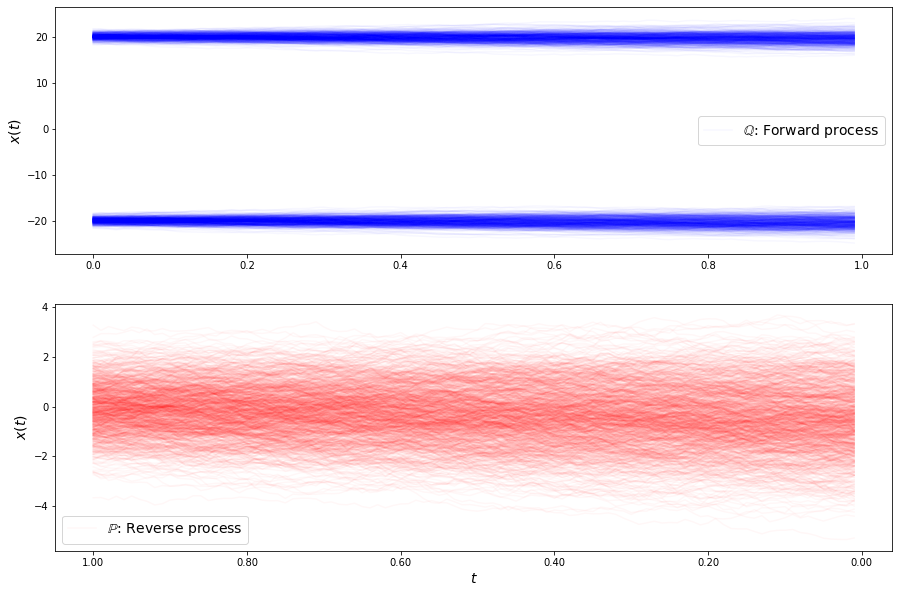

loss b 6.128574615902317
loss b 6.128807484048781
loss b 6.132918473981263
loss b 6.124807724076599
loss b 6.12357160440006
loss b 6.114195767337648
loss b 6.119361227179046
loss b 6.118568902426192
loss b 6.111444385825055
loss b 6.1125954966057146
loss b 6.10849266117067
loss b 6.107364379380023
loss b 6.1009967322222245
loss b 6.100704899082419
loss b 6.0957999066692325
loss b 6.095707150431081
loss b 6.09136278151408
loss b 6.0875127894757215
loss b 6.08579983416065
loss b 6.0897160075267776
loss b 6.082959592929691
loss b 6.078180910974885
loss b 6.081550687353573
loss b 6.076832863847252
loss b 6.0800822364293685
loss b 6.083486527168147
loss b 6.074302238149694
loss b 6.068511380705997
loss b 6.061226123224473
loss b 6.066940695329985
loss f 5.949126561743622
loss f 5.952902047944204
loss f 5.954088338069367
loss f 5.95198740878508
loss f 5.950683779782761
loss f 5.950778860752983
loss f 5.944500745351759
loss f 5.939934738596747
loss f 5.941407229843272
loss f 5.932593546316299

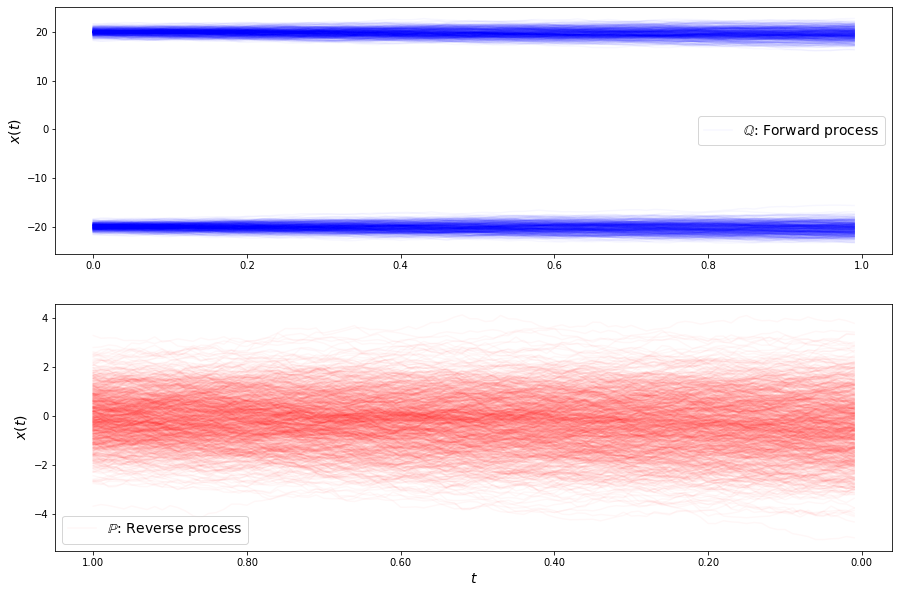

loss b 5.999334283043712
loss b 5.99611014792122
loss b 5.99811558361982
loss b 5.994348411988405
loss b 5.993468031548809
loss b 5.984868089306392
loss b 5.988601387033149
loss b 5.988962089093328
loss b 5.9885464543437985
loss b 5.982653412824063
loss b 5.976353149465388
loss b 5.974696345459751
loss b 5.978715613233922
loss b 5.975246999152687
loss b 5.9775370752791535
loss b 5.970466351562895
loss b 5.974347238491051
loss b 5.96870361621689
loss b 5.965405070082606
loss b 5.963782533458545
loss b 5.966324197164976
loss b 5.960653846320536
loss b 5.958161584108795
loss b 5.958680378355955
loss b 5.955228634864392
loss b 5.952200003734912
loss b 5.946213168965943
loss b 5.949770638729889
loss b 5.947231907452984
loss b 5.941710822255769
loss f 5.829610573056541
loss f 5.830411707465304
loss f 5.830160602433201
loss f 5.820489650445086
loss f 5.8267244932489035
loss f 5.821029191120938
loss f 5.823828875392187
loss f 5.8268744243421144
loss f 5.824666210194256
loss f 5.821297484380426

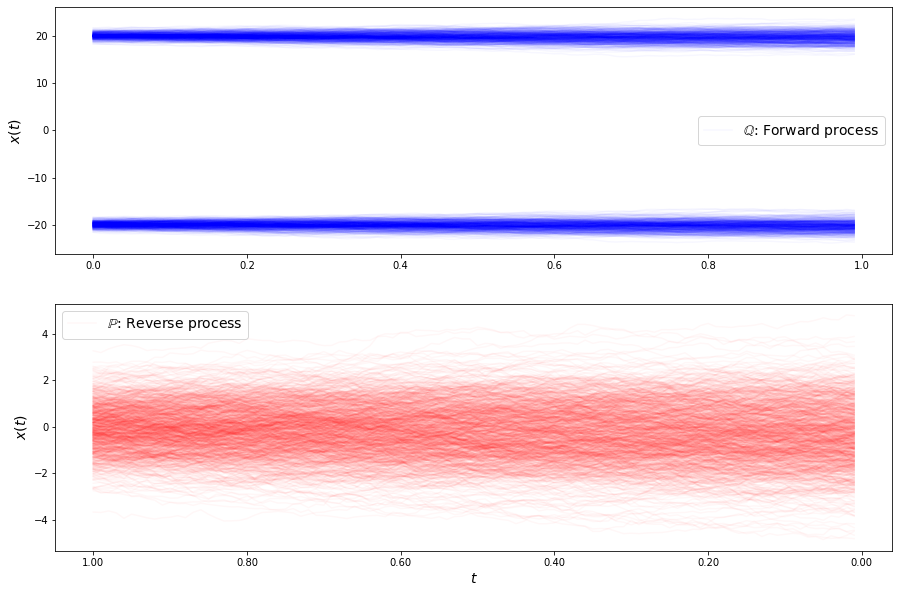

loss b 5.895296282884915
loss b 5.889165608190825
loss b 5.88470243676235
loss b 5.89005221646805
loss b 5.885919923749135
loss b 5.886756018593211
loss b 5.880017031011455
loss b 5.878895696769153
loss b 5.880268893041179
loss b 5.880531003119114
loss b 5.872834241634077
loss b 5.873046018770501
loss b 5.870514981713291
loss b 5.868180142926562
loss b 5.873367465615229
loss b 5.865533386958356
loss b 5.870112202352128
loss b 5.862971353392502
loss b 5.8624219128320725
loss b 5.864064408506253
loss b 5.857182235668394
loss b 5.8602369154422105
loss b 5.860704625309673
loss b 5.856376579402529
loss b 5.856750688917041
loss b 5.8556304728296285
loss b 5.852233842096089
loss b 5.8525514267801135
loss b 5.8531016321859575
loss b 5.846325017628944
loss f 5.737453380955354
loss f 5.735979160852779
loss f 5.7338499111797585
loss f 5.730180183874763
loss f 5.733132289516789
loss f 5.725908507501986
loss f 5.726966766865015
loss f 5.7310929404754996
loss f 5.7243658810938625
loss f 5.7199859923

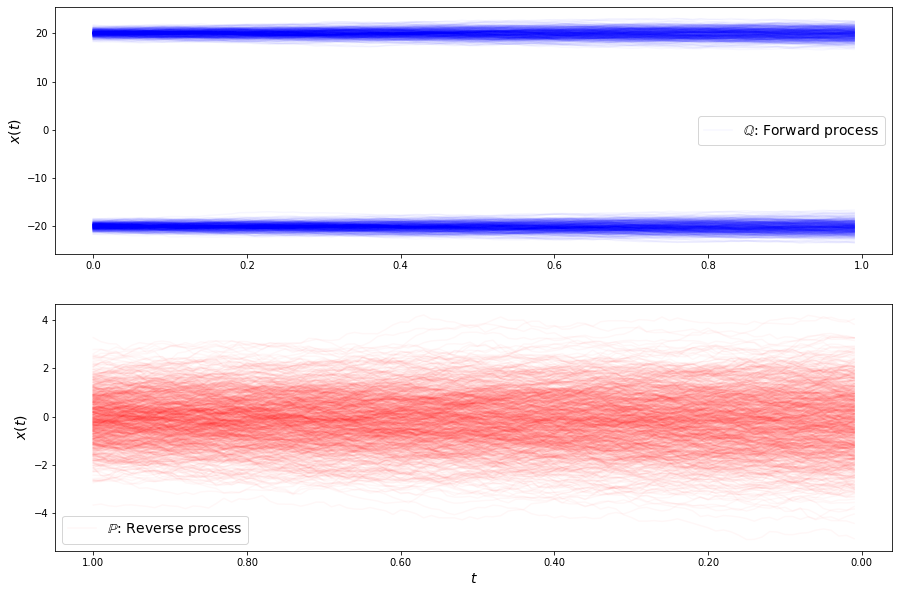

loss b 5.809321310632854
loss b 5.806695902811529
loss b 5.8013186745930385
loss b 5.80554179451039
loss b 5.80282627766245
loss b 5.803562962513874
loss b 5.80480402486413
loss b 5.799665809636812
loss b 5.800502703620189
loss b 5.794885837723849
loss b 5.7954687498668225
loss b 5.798185555841872
loss b 5.79445197252515
loss b 5.7964681053121625
loss b 5.791391553737859
loss b 5.7894572297741185
loss b 5.793621903558265
loss b 5.7939564298024875
loss b 5.786166852032461
loss b 5.7867690420799045
loss b 5.787382064242248
loss b 5.784225884874779
loss b 5.783777666298042
loss b 5.785099577010069
loss b 5.783632554384042
loss b 5.783918147168969
loss b 5.779240364787017
loss b 5.7783290943353425
loss b 5.777571514588617
loss b 5.777912707525455
loss f 5.666450312865434
loss f 5.6625330401769745
loss f 5.66185541319556
loss f 5.658302286833395
loss f 5.672656568842384
loss f 5.66027435957778
loss f 5.659163450021647
loss f 5.651668426744713
loss f 5.658379318946306
loss f 5.66413078726053

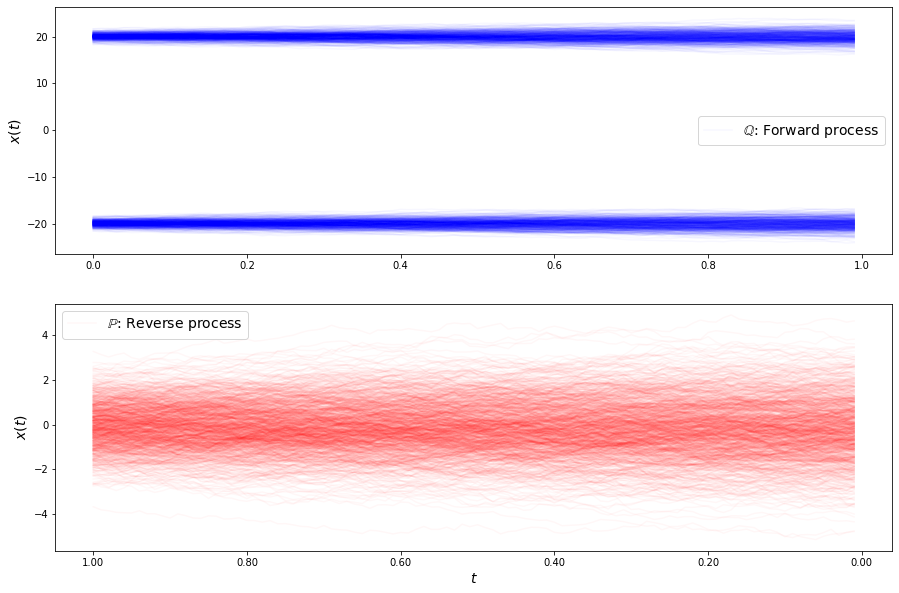

loss b 5.749396566595099
loss b 5.75580013679493
loss b 5.752939019438636
loss b 5.75578370828844
loss b 5.751710887920364
loss b 5.75582024124776
loss b 5.753493961243865
loss b 5.744440439176328
loss b 5.7454490177661866
loss b 5.750113145793475
loss b 5.750104932543846
loss b 5.74477897025408
loss b 5.744620670523218
loss b 5.749002564951952
loss b 5.748350420808917
loss b 5.749265364103105
loss b 5.75001021594087
loss b 5.745275913589002
loss b 5.74045869770473
loss b 5.743275720594954
loss b 5.740102059339123
loss b 5.740292747905939
loss b 5.742896132223329
loss b 5.741901870273554
loss b 5.74310552037163
loss b 5.741815471909969
loss b 5.741079266076137
loss b 5.738886513877759
loss b 5.742714278556741
loss b 5.742450451123248
loss f 5.617728091919229
loss f 5.627747514465034
loss f 5.6208029356544
loss f 5.627706963375288
loss f 5.623548849533087
loss f 5.620758897707275
loss f 5.6284187478996195
loss f 5.618431500060044
loss f 5.621960769860513
loss f 5.621968587464308
loss f 

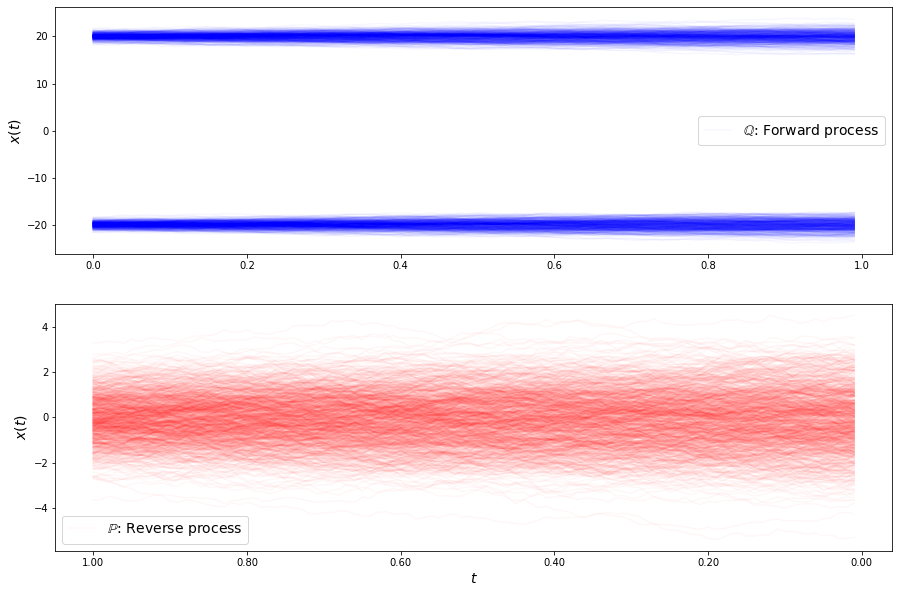

loss b 5.728927643561541
loss b 5.730308465044192
loss b 5.727537213239436
loss b 5.732134404229045
loss b 5.7298040198051945
loss b 5.730007691180309
loss b 5.723970788706488
loss b 5.728949298360096
loss b 5.726359390533946
loss b 5.722932489113473
loss b 5.727071666177428
loss b 5.73074631657309
loss b 5.729013778028068
loss b 5.7264374000693
loss b 5.728366111670602
loss b 5.724350682946422
loss b 5.727675142691026
loss b 5.725155138382653
loss b 5.727409725970527
loss b 5.725320145507212
loss b 5.726994147031909
loss b 5.724983581070911
loss b 5.726695770870417
loss b 5.723634466857673
loss b 5.726306846393368
loss b 5.727926546799663
loss b 5.725050356297763
loss b 5.731365853318328
loss b 5.7276996060756025
loss b 5.730911477546871
loss f 5.621490570809025
loss f 5.603605373032902
loss f 5.613268679700074
loss f 5.6076711020764805
loss f 5.616430609828207
loss f 5.621119285209607
loss f 5.607766613253169
loss f 5.617516574683503
loss f 5.6080702468446875
loss f 5.61568723714715


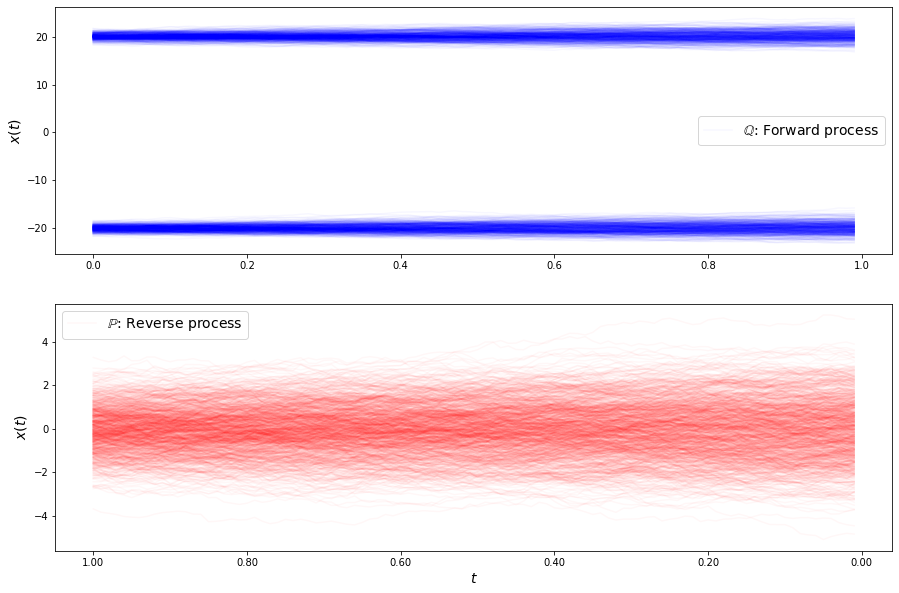

loss b 5.736253654529248
loss b 5.729582006732959
loss b 5.727636563897966
loss b 5.732756217848063
loss b 5.7271248113260125
loss b 5.735565737577771
loss b 5.7312478552250665
loss b 5.732771581154983
loss b 5.729928719664475
loss b 5.734920279328563
loss b 5.7319434953077915
loss b 5.728818432196673
loss b 5.729298210444482
loss b 5.731837583421599
loss b 5.729055989219583
loss b 5.727066369077305
loss b 5.730743999202879
loss b 5.737397745918307
loss b 5.733841564780058
loss b 5.735580711723695
loss b 5.735738004415523
loss b 5.735144987812347
loss b 5.735430405712393
loss b 5.734731476497352
loss b 5.73242939618647
loss b 5.73116496542579
loss b 5.7371752769821756
loss b 5.732467363699665
loss b 5.732636706020952
loss b 5.734220803719029
loss f 5.620600093461291
loss f 5.627215130389031
loss f 5.615956908970337
loss f 5.62505976816588
loss f 5.628947152413498
loss f 5.628318532395804
loss f 5.627782425284501
loss f 5.628403184830459
loss f 5.6304546208365585
loss f 5.62922687017340

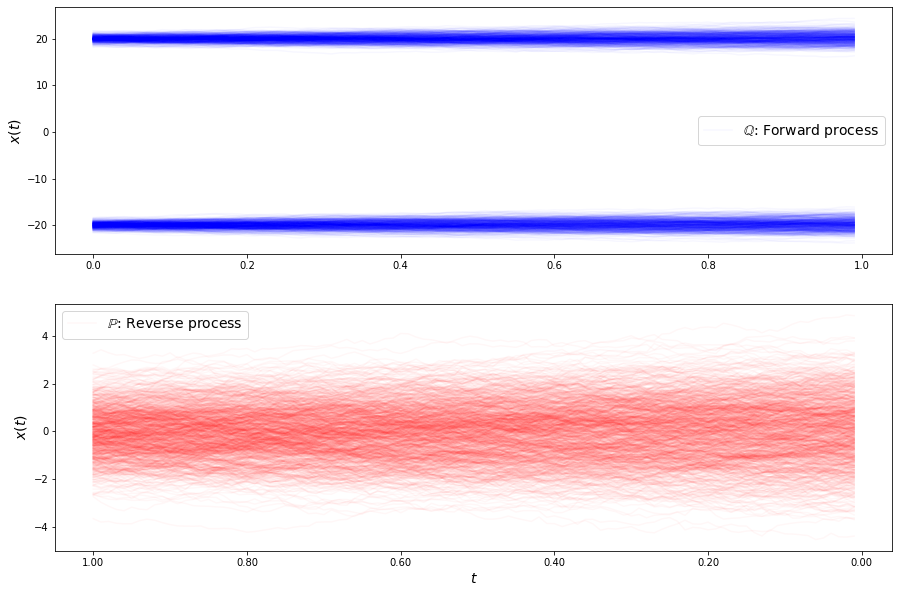

loss b 5.751966656891584
loss b 5.750564763671605
loss b 5.749980384593874
loss b 5.7533571608437954
loss b 5.75049933148672
loss b 5.754800604687448
loss b 5.755820854691012
loss b 5.755884103478411
loss b 5.756413318163184
loss b 5.760134009947954
loss b 5.756376344708294
loss b 5.754900219813622
loss b 5.759932286895965
loss b 5.754642040485933
loss b 5.756778375514414
loss b 5.758446661617949
loss b 5.75664911249746
loss b 5.7571085587202155
loss b 5.758141989000465
loss b 5.76314768266801
loss b 5.76422821801889
loss b 5.763342608838105
loss b 5.761738316872799
loss b 5.764177052818793
loss b 5.764177076745725
loss b 5.766860088964001
loss b 5.765776277313158
loss b 5.770858296816714
loss b 5.7656227316294775
loss b 5.7653322422591495
loss f 5.656544525771516
loss f 5.658099829408515
loss f 5.6545603434975575
loss f 5.661687886494562
loss f 5.668168306267986
loss f 5.657683066589603
loss f 5.663680971893971
loss f 5.667342388359721
loss f 5.6583271675256555
loss f 5.66326899343383

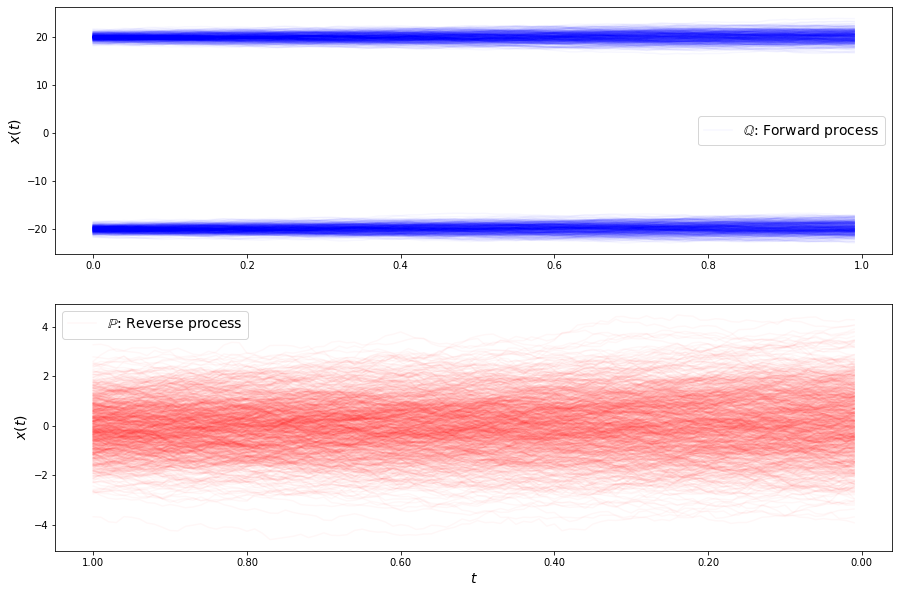

loss b 5.783676990462455
loss b 5.793674215879902
loss b 5.794574091920691
loss b 5.789272962962765
loss b 5.795843066567775
loss b 5.790795787122793
loss b 5.793347516730037
loss b 5.793431945217169
loss b 5.791726729162086
loss b 5.79676970860152
loss b 5.801303340991365
loss b 5.7963705818388656
loss b 5.796724567858884
loss b 5.7994487524338565
loss b 5.802564824600229
loss b 5.804595988057036
loss b 5.801661308037723
loss b 5.801378720745467
loss b 5.8046219456831345
loss b 5.802652727160167
loss b 5.806023517367689
loss b 5.807435300795363
loss b 5.808188461349354
loss b 5.802390538182709
loss b 5.80097099996091
loss b 5.809395045459406
loss b 5.812206473550399
loss b 5.808931801443053
loss b 5.80710944521642
loss b 5.812455673874929
loss f 5.706022150135454
loss f 5.705432133120073
loss f 5.708764942325473
loss f 5.704186208183887
loss f 5.70259813862653
loss f 5.696291149297567
loss f 5.711948420012899
loss f 5.6985690286839885
loss f 5.703440805681158
loss f 5.707414573926498


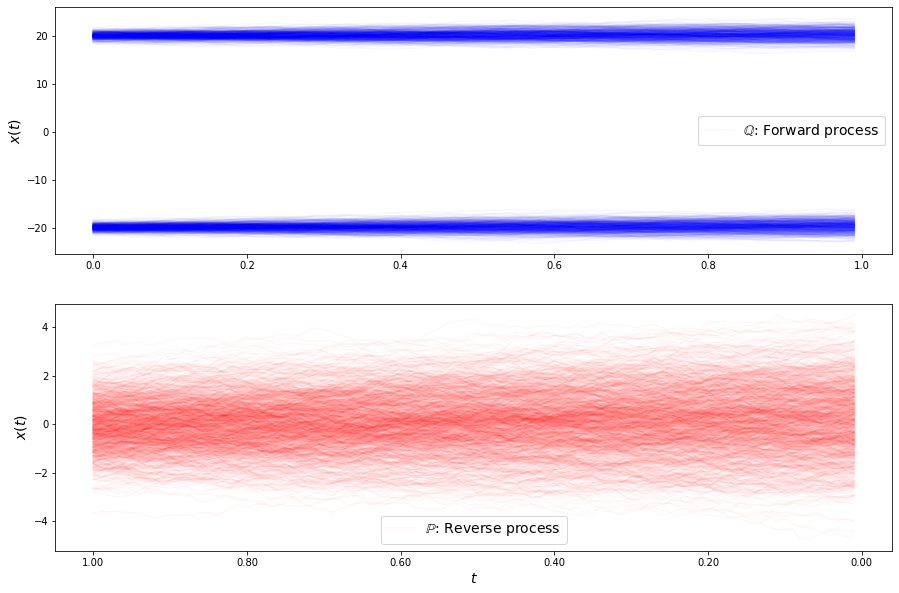

loss b 5.840642694246315
loss b 5.846309730639845
loss b 5.843168101609706
loss b 5.852063064953132
loss b 5.844969425606089
loss b 5.847370476977676
loss b 5.846022372238094
loss b 5.85229679214819
loss b 5.848630147206686
loss b 5.851986127443111
loss b 5.849560636290233
loss b 5.849786736365193
loss b 5.849891629713895
loss b 5.857059420177532
loss b 5.855458203701522
loss b 5.853597853940387
loss b 5.856934399524473
loss b 5.857094874195606
loss b 5.861147085686661
loss b 5.862589718012642
loss b 5.859903764695485
loss b 5.86026591235583
loss b 5.8616636911122475
loss b 5.863914311726713
loss b 5.862361702113248
loss b 5.866374188605377
loss b 5.868108551132685
loss b 5.866951067722
loss b 5.870190819591951
loss b 5.8749885000561815
loss f 5.759964195627103
loss f 5.755301077017146
loss f 5.765299204444851
loss f 5.765317901522546
loss f 5.758266196915073
loss f 5.760499373327834
loss f 5.760685652686085
loss f 5.770065517363286
loss f 5.773281207038047
loss f 5.7713447600499315
lo

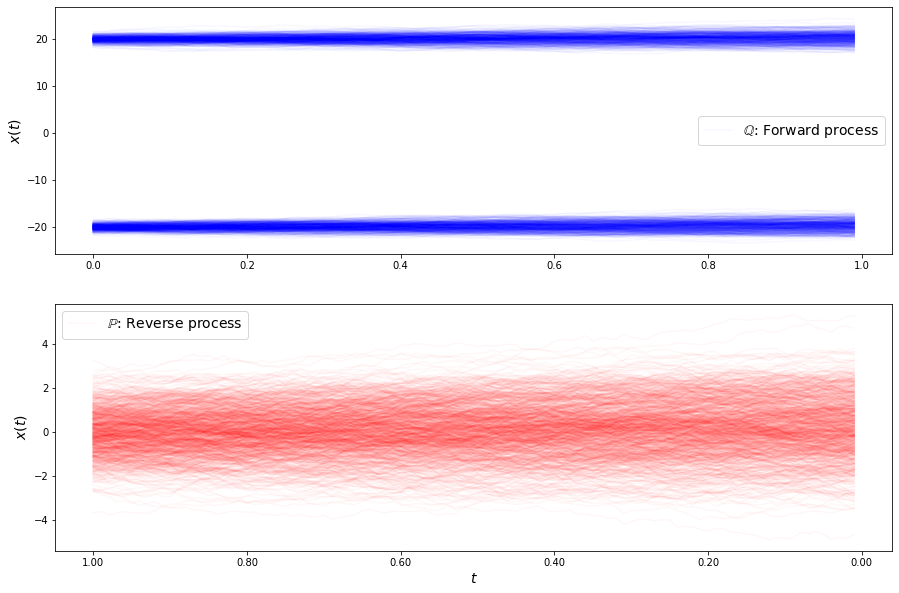

loss b 5.903658608348943
loss b 5.9018015123482055
loss b 5.900485744266184
loss b 5.8981270703969155
loss b 5.907111365206679
loss b 5.905655809521479
loss b 5.908887983368292
loss b 5.906432925209036
loss b 5.907986904462325
loss b 5.9161593018312635
loss b 5.9085046252804805
loss b 5.908538038925566
loss b 5.9175583412529
loss b 5.909153448567478
loss b 5.915116089231275
loss b 5.919796396433346
loss b 5.915967887017492
loss b 5.916655777945524
loss b 5.922530401948618
loss b 5.9219505428893715
loss b 5.9176713232896425
loss b 5.923686534814806
loss b 5.926625716210736
loss b 5.920648395935994
loss b 5.924638102102329
loss b 5.930509626471261
loss b 5.923615484411005
loss b 5.927973862111273
loss b 5.930570373620351
loss b 5.93320385462927
loss f 5.818872241080374
loss f 5.821442880701905
loss f 5.823568274213085
loss f 5.830064961900659
loss f 5.828333418137843
loss f 5.8300052255583505
loss f 5.828397119635058
loss f 5.834300929948983
loss f 5.8286834530423395
loss f 5.82784900686

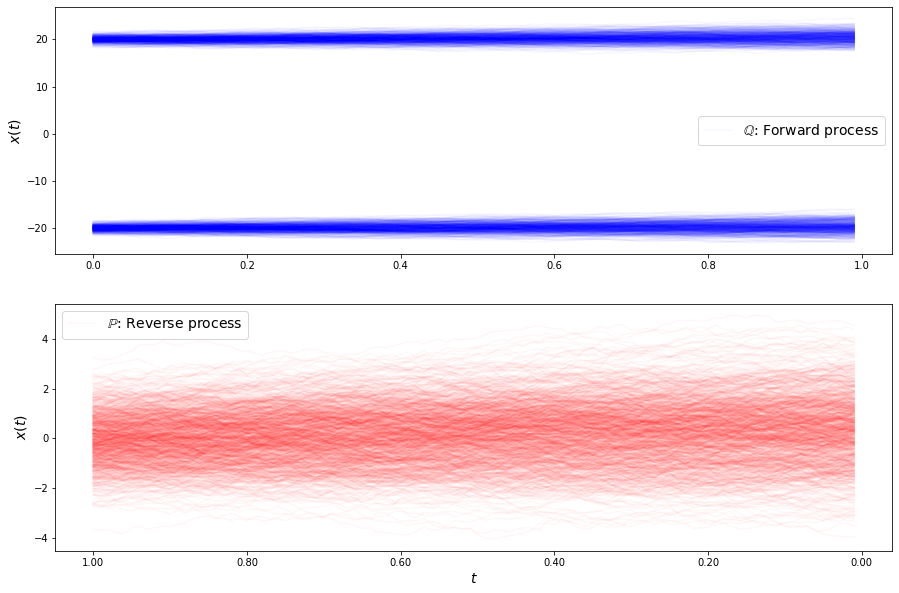

loss b 5.967075572572201
loss b 5.964032404341517
loss b 5.96900002152051
loss b 5.968226180342672
loss b 5.970453853007671
loss b 5.971894799409648
loss b 5.972544894017111
loss b 5.972741518406555
loss b 5.975381722939325
loss b 5.972709783378123
loss b 5.975766642611797
loss b 5.974577082459544
loss b 5.9785519166147685
loss b 5.976857582428731
loss b 5.981478506203469
loss b 5.9837622337825565
loss b 5.978642111231717
loss b 5.985357108190711
loss b 5.9850334335153885
loss b 5.98998111369074
loss b 5.984744595765802
loss b 5.986050477097152
loss b 5.992799078567512
loss b 5.987051807723115
loss b 5.99013587241481
loss b 5.996700642554353
loss b 5.994717969096791
loss b 5.996943742125322
loss b 5.995626139125717
loss b 5.9981950759644445
loss f 5.888741592554949
loss f 5.893106033482825
loss f 5.896214940390011
loss f 5.9016706125463285
loss f 5.896003514033934
loss f 5.893223979662185
loss f 5.891904011231149
loss f 5.899071249915945
loss f 5.897206196271518
loss f 5.89903372948249

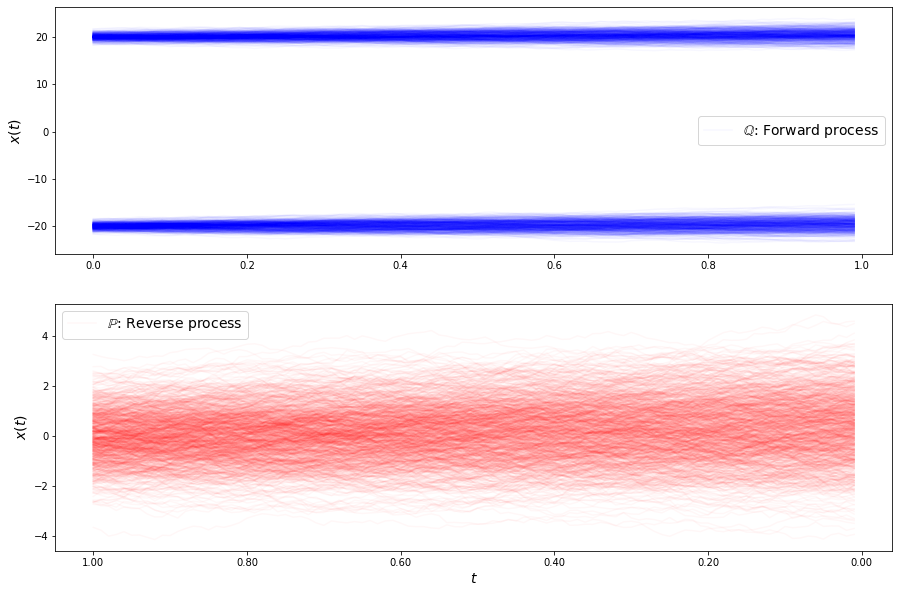

loss b 6.031798231557432
loss b 6.027501824075122
loss b 6.032678258610667
loss b 6.036556913356593
loss b 6.033269858490123
loss b 6.032120214433235
loss b 6.037627830879971
loss b 6.038021877410412
loss b 6.036612491029865
loss b 6.039902425115357
loss b 6.036749298768076
loss b 6.0443878236890685
loss b 6.043319674154598
loss b 6.042059003729884
loss b 6.044062135367191
loss b 6.048164169728007
loss b 6.050674199678883
loss b 6.047675079774259
loss b 6.046197875531338
loss b 6.046027217895833
loss b 6.050196017716936
loss b 6.056265512091288
loss b 6.054787191800523
loss b 6.0523521012255985
loss b 6.057009344347821
loss b 6.060489059946373
loss b 6.057074842977683
loss b 6.058984030859039
loss b 6.059715599334083
loss b 6.062885391360527
loss f 5.951656404926084
loss f 5.954045607284105
loss f 5.959819703093508
loss f 5.947543519553625
loss f 5.95134979478506
loss f 5.956009739152992
loss f 5.959399329746998
loss f 5.963227646736645
loss f 5.960850466052971
loss f 5.965763961199433

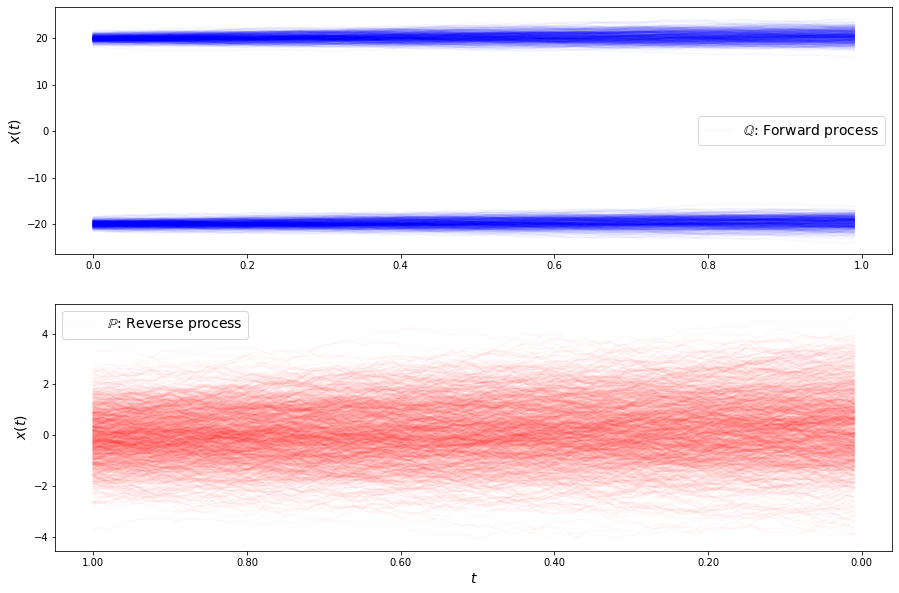

loss b 6.09442068720143
loss b 6.092746844520505
loss b 6.091157299890418
loss b 6.095425798471069
loss b 6.094695564201267
loss b 6.096707496469343
loss b 6.10524644940066
loss b 6.098125689638925
loss b 6.100735828392456
loss b 6.1029315435905716
loss b 6.102190047294197
loss b 6.103963834147641
loss b 6.105031538287893
loss b 6.107487828338946
loss b 6.110063147324
loss b 6.106113802811638
loss b 6.106741595684525
loss b 6.111260718484619
loss b 6.113322877966144
loss b 6.110271778311094
loss b 6.111769090699875
loss b 6.11303426482089
loss b 6.109155571661192
loss b 6.115980359116078
loss b 6.113452804067952
loss b 6.11980997603812
loss b 6.113366265601891
loss b 6.116959593659019
loss b 6.1237590415375225
loss b 6.12278247317925
loss f 6.018190031707888
loss f 6.021657722211086
loss f 6.02402096952978
loss f 6.019626826745298
loss f 6.01936092994815
loss f 6.023106046898161
loss f 6.0260664936515695
loss f 6.028821634924987
loss f 6.025780807783432
loss f 6.02331329998712
loss f 6

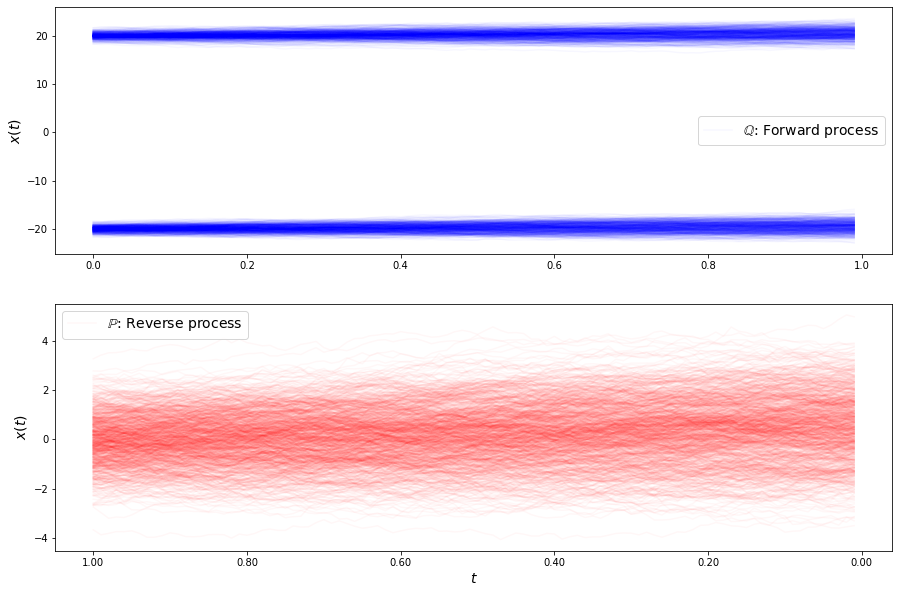

loss b 6.150758290843504
loss b 6.149767553261161
loss b 6.158211751849436
loss b 6.149194440739897
loss b 6.1588767289336035
loss b 6.153091880206487
loss b 6.1547819656078575
loss b 6.155017535683311
loss b 6.155745808516976
loss b 6.1597069205655055
loss b 6.159272499408944
loss b 6.159764867690593
loss b 6.156911371192376
loss b 6.156115317168142
loss b 6.166537729602807
loss b 6.161615491115934
loss b 6.163775546407104
loss b 6.1619249538386
loss b 6.167468186026993
loss b 6.162888925581788
loss b 6.167857364058955
loss b 6.165761401695231
loss b 6.165955421567566
loss b 6.173110702573816
loss b 6.1684859982419145
loss b 6.170139556764977
loss b 6.169938898087409
loss b 6.170092802592261
loss b 6.175589218234008
loss b 6.170965222019395
loss f 6.07189775988407
loss f 6.070441340397689
loss f 6.076140033277267
loss f 6.07464361053992
loss f 6.0689437181247765
loss f 6.069815689134175
loss f 6.0706090759842
loss f 6.076091219750631
loss f 6.068093843339265
loss f 6.080956605983403
l

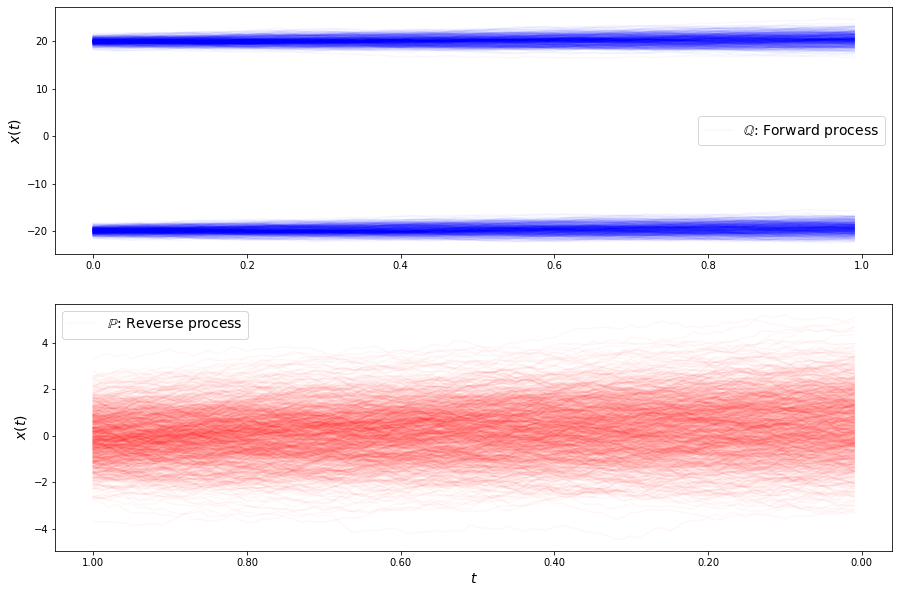

loss b 6.195792315114619
loss b 6.199364686003566
loss b 6.195600656968615
loss b 6.200057348572153
loss b 6.195962796672226
loss b 6.1996056695472035
loss b 6.2010561916061775
loss b 6.2021588881059335
loss b 6.201777128481365
loss b 6.205558517330339
loss b 6.204831397153673
loss b 6.203649310268117
loss b 6.202167099919465
loss b 6.20563747230134
loss b 6.209108678785138
loss b 6.207872265301245
loss b 6.206149299260626
loss b 6.207904374352145
loss b 6.211232209156885
loss b 6.20723005929116
loss b 6.211514970602327
loss b 6.214015925375535
loss b 6.205181895576878
loss b 6.212892610297312
loss b 6.215630681877126
loss b 6.21426038047417
loss b 6.215398462447471
loss b 6.221065489906482
loss b 6.220845466847998
loss b 6.220586374588658
loss f 6.1167510353025545
loss f 6.109234335675387
loss f 6.118619744298418
loss f 6.119959100131257
loss f 6.112275482959726
loss f 6.12106640803074
loss f 6.106202552928802
loss f 6.122092160023174
loss f 6.113542609181558
loss f 6.11584070106787
l

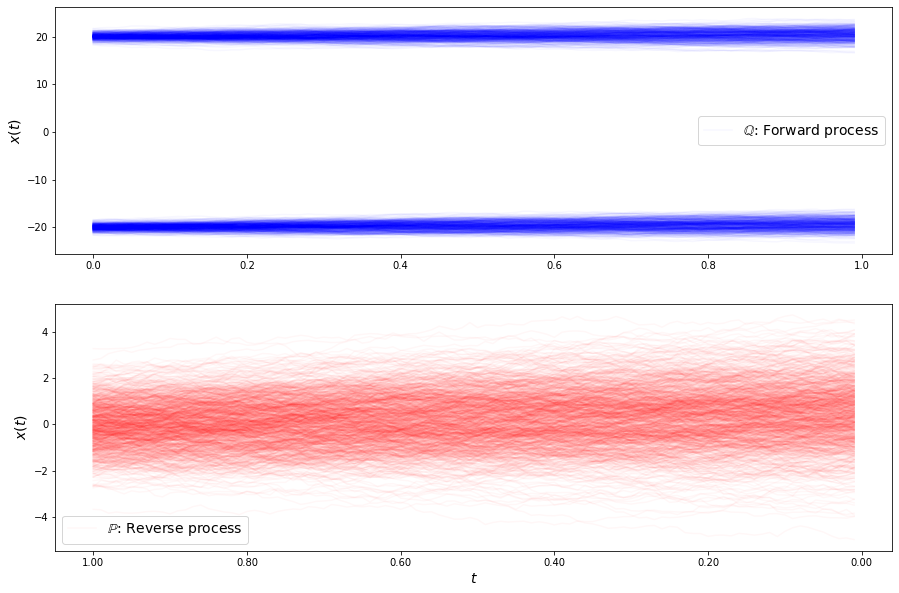

loss b 6.236202602875589
loss b 6.236529449348271
loss b 6.236607662155914
loss b 6.234367270255433
loss b 6.235792402335132
loss b 6.240732803864222
loss b 6.2394699008290715
loss b 6.234129602020078
loss b 6.2413281432547905
loss b 6.243127617891525
loss b 6.240276403749085
loss b 6.241012768806656
loss b 6.240339489985775
loss b 6.23317332858418
loss b 6.244426385897109
loss b 6.243352236971095
loss b 6.243709222994072
loss b 6.243504801681155
loss b 6.2378164757691925
loss b 6.248743590170857
loss b 6.236018332588667
loss b 6.249496389112344
loss b 6.2479690566146
loss b 6.254523189405887
loss b 6.244774645362503
loss b 6.248267155157283
loss b 6.246461583358539
loss b 6.246926059508828
loss b 6.246628573428198
loss b 6.251235784426696
loss f 6.147560420581623
loss f 6.152879738362041
loss f 6.139784723833262
loss f 6.1451744816594145
loss f 6.148257489217512
loss f 6.14745490469817
loss f 6.1480461128407144
loss f 6.157149461712667
loss f 6.154675106401108
loss f 6.154025313350823

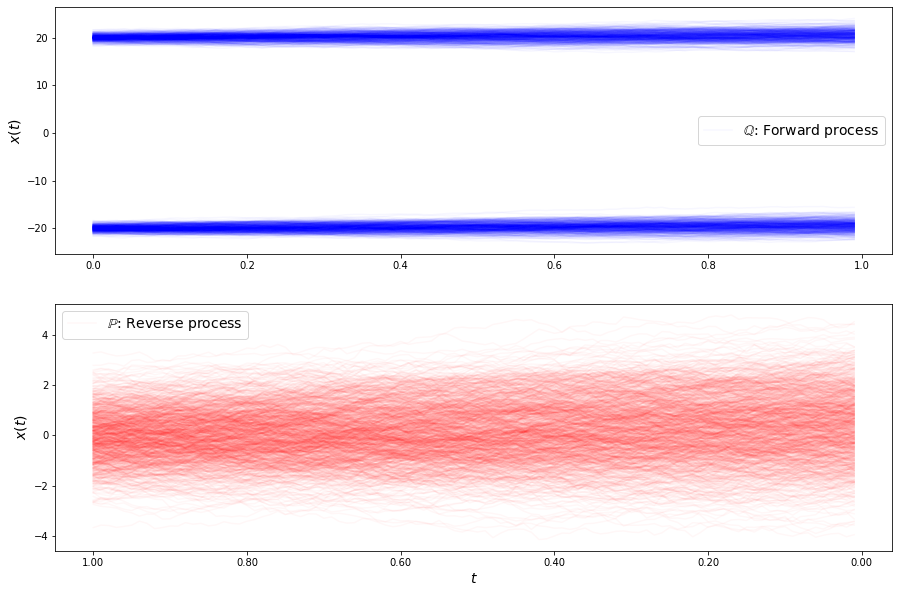

loss b 6.259531814355172
loss b 6.258185443342069
loss b 6.261771487637285
loss b 6.262634123147208
loss b 6.2633044414744194
loss b 6.257132765068131
loss b 6.262136031157922
loss b 6.266018188957937
loss b 6.262976032611355
loss b 6.262780999240908
loss b 6.2554959466814415
loss b 6.262410809144988
loss b 6.266306672483799
loss b 6.264281565218847
loss b 6.265887456844759
loss b 6.264313262383204
loss b 6.266375658049436
loss b 6.268382380758853
loss b 6.266280558251077
loss b 6.260355872818339
loss b 6.265397549644659
loss b 6.263643419365533
loss b 6.266566730812263
loss b 6.265238726738326
loss b 6.270402608879706
loss b 6.274171135212796
loss b 6.268760094030287
loss b 6.267873235428946
loss b 6.270107506151318
loss b 6.269263496788913
loss f 6.158374997882346
loss f 6.163618021451221
loss f 6.1569831081152095
loss f 6.16754562001274
loss f 6.162701018757075
loss f 6.1716365515296205
loss f 6.159455291685323
loss f 6.163433713451134
loss f 6.164673460130093
loss f 6.1670908349100

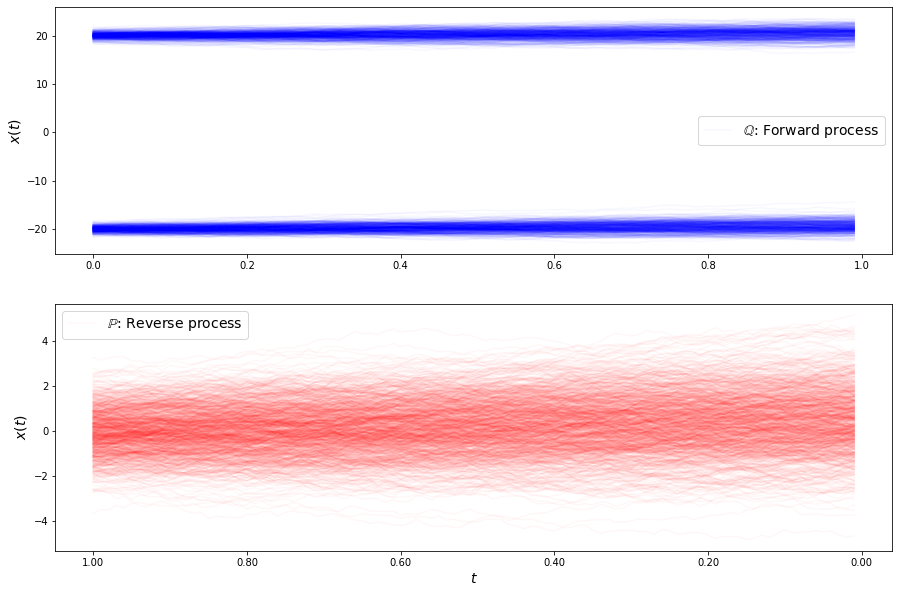

loss b 6.269998765978604
loss b 6.270330305082675
loss b 6.26912439261291
loss b 6.268021753579014
loss b 6.274644789420125
loss b 6.269955086351462
loss b 6.27237501616103
loss b 6.270577077688762
loss b 6.2735767633147255
loss b 6.275570479388184
loss b 6.275391467791371
loss b 6.273999473322096
loss b 6.270104586962916
loss b 6.27623270828382
loss b 6.273351440215013
loss b 6.270832229064948
loss b 6.272944824475638
loss b 6.267228768773058
loss b 6.272630973644931
loss b 6.269009797568201
loss b 6.267084216017525
loss b 6.27127515278139
loss b 6.275704080190789
loss b 6.270650013251991
loss b 6.275320817111203
loss b 6.269988740018841
loss b 6.275996378498757
loss b 6.274858648586242
loss b 6.272995420414467
loss b 6.275623244215208
loss f 6.1597442460460625
loss f 6.166162257132864
loss f 6.165772173361809
loss f 6.166279337803082
loss f 6.165426570859987
loss f 6.170569312280505
loss f 6.163053321462397
loss f 6.166556528519575
loss f 6.1665327248466495
loss f 6.163915912011794
l

In [ ]:
torch.autograd.set_detect_anomaly(True)
c.fit(300, 30, burn_iterations=0, plot=True)

In [ ]:
plt.plot(c.loss_f[10:])
plt.show()
plt.plot(c.loss_b[10:])

In [17]:
bb = lambda X: -c.b_backward(X)

t, Xts = c.sde_solver(
    c.b_forward.forward, c.sigma,
    c.X_0, c.dt,  c.number_time_steps, 0.0,
    c.theta_f, False, True
)
t_, Xts_ = c.sde_solver(
    bb, c.sigma, 
    c.X_1, c.dt, c.number_time_steps, 0.0, 
    c.theta_b, False, False
)

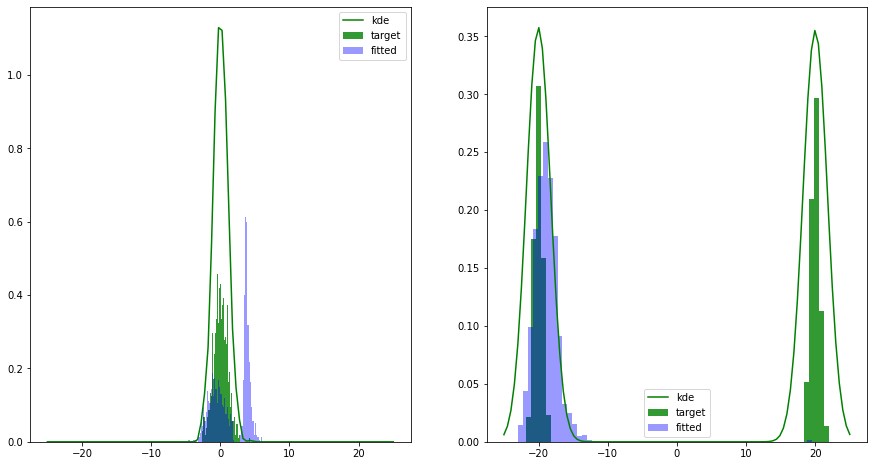

In [18]:
fig, axs = plt.subplots(1,2, figsize=(15, 8))
batch_terminal_empirical_f = next(c.data_stream(forward=True))
xx = torch.linspace(-25, 25).reshape(-1,1).cuda().double()

H = silvermans_rule(batch_terminal_empirical_f)
kd  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_f, H).detach().cpu().numpy())
axs[1].plot(xx.detach().cpu().numpy(), kd, label="kde", color="green")


bins = 60
axs[1].hist(( X1.detach().cpu().numpy().flatten()), alpha=0.8, bins=bins, label="target", density=True, color="green");
axs[1].hist(( Xts_[:,-1,:-1].flatten().detach().cpu().numpy()), alpha=0.4, bins=bins, label="fitted", density=True, color="blue");
axs[1].legend()




batch_terminal_empirical_b = next(c.data_stream(forward=False))
# xx = torch.linspace(-10, 10).reshape(-1,1).cuda().double()

Hb = silvermans_rule(batch_terminal_empirical_b)
kd  = np.exp(log_kde_pdf_per_point(xx, batch_terminal_empirical_b, Hb).detach().cpu().numpy())
axs[0].plot(xx.detach().cpu().numpy(), kd, label="kde", color="green")


bins = 60
axs[0].hist(( X2.detach().cpu().numpy().flatten()), alpha=0.8, bins=bins, label="target", density=True, color="green");
axs[0].hist(( Xts[:,-1,:-1].flatten().detach().cpu().numpy()), alpha=0.4, bins=bins, label="fitted", density=True, color="blue");
axs[0].legend()